In [1]:
# NN-bax things
import sys

import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import random

# NEB things
from ase.io import read
from ase.neb import NEB

from ase.neb import NEBTools
import copy

from ase.calculators.lj import LennardJones

from ase import Atoms
from ase.optimize import LBFGS, MDMin, FIRE
from ase.io import Trajectory

from ase.optimize.basin import BasinHopping
from ase.optimize.minimahopping import MinimaHopping

from ase.visualize import view
from tqdm import tqdm
import sys
import os
import glob
import time
import subprocess
import sys

from fairchem.core import OCPCalculator
from fairchem.core.models.model_registry import available_pretrained_models

import pickle
from sklearn.decomposition import PCA
from scipy.interpolate import griddata

sys.path.insert(0, '../nn-bax')
from nn_bax.base_model import ActiveModel, ActiveData, Posterior
from nn_bax.normalizers import StandardNormalizer

from examples.fine_tune.example_mlp import ActiveMLP
from fairchem.core import OCPCalculator
from fairchem.core.models.model_registry import available_pretrained_models
from fairchem.core.common.tutorial_utils import fairchem_main

# Redirect stderr to null
sys.stderr = open(os.devnull, 'w')


In [2]:
from ase.io import read
from ase.db import connect
from ase.calculators.singlepoint import SinglePointCalculator

# Generating List of Atoms Objects to Write in

In [3]:
ase_calculator = LennardJones(rc=100)
test = Trajectory("9_12_8to10_FullLJ38_620NEB_fmax=0p1_20img_0to1.traj")
test

In [4]:
energies = []
for i in range(len(test)):
    print(test[i].get_potential_energy())
    energies.append(test[i].get_potential_energy())

-169.30446567688628
-170.9924926262396


In [5]:
initial_ase = copy.deepcopy(test[0])
initial_ase.set_calculator(copy.deepcopy(ase_calculator))
final_ase = copy.deepcopy(test[1])
final_ase.set_calculator(copy.deepcopy(ase_calculator))

In [6]:
# 2.A. NEB using ASE
n_images = 20
images_ase = [initial_ase]
for i in range(1, n_images-1):
    image_ase = initial_ase.copy()
    image_ase.set_calculator(copy.deepcopy(ase_calculator))
    images_ase.append(image_ase)
images_ase.append(final_ase)


neb_ase = NEB(images_ase, climb=False, remove_rotation_and_translation=True, method='string')
neb_ase.interpolate(method='linear')
qn_ase = FIRE(neb_ase)
qn_ase.run(fmax=0.1, steps=1000)

      Step     Time          Energy          fmax
FIRE:    0 10:54:39     -164.907359       14.487974
FIRE:    1 10:54:39     -166.254374        6.877305
FIRE:    2 10:54:39     -166.677119        8.612043
FIRE:    3 10:54:39     -166.868307        5.571544
FIRE:    4 10:54:39     -167.267543        2.238904
FIRE:    5 10:54:40     -167.254754        5.108893
FIRE:    6 10:54:40     -167.359685        3.750955
FIRE:    7 10:54:40     -167.477788        1.890605
FIRE:    8 10:54:40     -167.525967        1.862706
FIRE:    9 10:54:40     -167.523995        3.130986
FIRE:   10 10:54:40     -167.535049        2.937933
FIRE:   11 10:54:40     -167.554827        2.564936
FIRE:   12 10:54:40     -167.579327        2.040776
FIRE:   13 10:54:41     -167.604046        1.419715
FIRE:   14 10:54:41     -167.625381        1.340712
FIRE:   15 10:54:41     -167.641959        1.370087
FIRE:   16 10:54:41     -167.655222        1.447081
FIRE:   17 10:54:41     -167.669900        1.519822
FIRE:   18 10:

FIRE:  157 10:55:01     -168.916897        1.402903
FIRE:  158 10:55:01     -168.919959        0.793134
FIRE:  159 10:55:01     -168.923940        1.493340
FIRE:  160 10:55:01     -168.928843        0.680223
FIRE:  161 10:55:01     -168.934730        1.965626
FIRE:  162 10:55:01     -168.938629        1.382615
FIRE:  163 10:55:01     -168.938167        1.135559
FIRE:  164 10:55:02     -168.937405        2.153782
FIRE:  165 10:55:02     -168.935781        5.432228
FIRE:  166 10:55:02     -168.937540        0.800847
FIRE:  167 10:55:02     -168.936798        5.275317
FIRE:  168 10:55:02     -168.937691        3.813243
FIRE:  169 10:55:02     -168.938621        1.369207
FIRE:  170 10:55:02     -168.939019        1.295226
FIRE:  171 10:55:02     -168.939186        1.214510
FIRE:  172 10:55:03     -168.939338        1.056763
FIRE:  173 10:55:03     -168.939488        0.832984
FIRE:  174 10:55:03     -168.939641        0.778464
FIRE:  175 10:55:03     -168.939796        0.776184
FIRE:  176 1

FIRE:  315 10:55:22     -168.908699        0.741585
FIRE:  316 10:55:23     -168.908526        0.543320
FIRE:  317 10:55:23     -168.908389        0.771283
FIRE:  318 10:55:23     -168.908312        0.578565
FIRE:  319 10:55:23     -168.908320        0.781694
FIRE:  320 10:55:23     -168.908464        0.720729
FIRE:  321 10:55:23     -168.908855        0.785256
FIRE:  322 10:55:23     -168.909739        0.924975
FIRE:  323 10:55:24     -168.911557        0.923205
FIRE:  324 10:55:24     -168.914970        1.028378
FIRE:  325 10:55:24     -168.920539        2.483910
FIRE:  326 10:55:24     -168.928293        7.697884
FIRE:  327 10:55:24     -168.925135        0.859284
FIRE:  328 10:55:24     -168.924969        0.768334
FIRE:  329 10:55:24     -168.924843        0.778338
FIRE:  330 10:55:25     -168.924764        0.811871
FIRE:  331 10:55:25     -168.924705        0.814226
FIRE:  332 10:55:25     -168.924663        0.785250
FIRE:  333 10:55:25     -168.924640        0.728881
FIRE:  334 1

FIRE:  473 10:55:45     -168.915142        1.404144
FIRE:  474 10:55:45     -168.912157        1.887165
FIRE:  475 10:55:45     -168.908575        2.808698
FIRE:  476 10:55:45     -168.905348        4.241798
FIRE:  477 10:55:45     -168.904782        9.232847
FIRE:  478 10:55:45     -168.908680        5.340662
FIRE:  479 10:55:45     -168.915291        5.373874
FIRE:  480 10:55:46     -168.918532        5.763762
FIRE:  481 10:55:46     -168.917326        4.513244
FIRE:  482 10:55:46     -168.914289        3.875585
FIRE:  483 10:55:46     -168.912419        3.266493
FIRE:  484 10:55:46     -168.911121        2.508392
FIRE:  485 10:55:46     -168.909983        2.493345
FIRE:  486 10:55:46     -168.908887        2.580918
FIRE:  487 10:55:46     -168.907876        2.557320
FIRE:  488 10:55:47     -168.907079        2.396503
FIRE:  489 10:55:47     -168.906692        2.126704
FIRE:  490 10:55:47     -168.907029        1.823691
FIRE:  491 10:55:47     -168.908672        1.871036
FIRE:  492 1

True

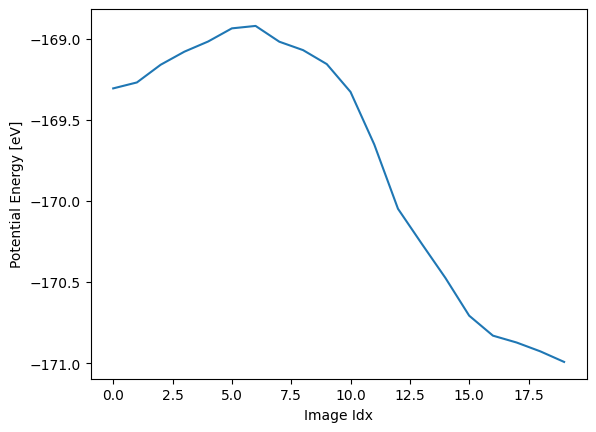

Barrier:  0.38555818435634137


In [7]:
energies = [images_ase[i].get_potential_energy() for i in range(len(images_ase))]
%matplotlib inline
plt.plot(energies)
plt.xlabel('Image Idx')
plt.ylabel('Potential Energy [eV]')

#plt.savefig('lj7_example_energy_barriers.pdf', bbox_inches='tight')
plt.show()
print("Barrier: ", max(energies) - initial_ase.get_potential_energy())

In [8]:
# Assume initial_ase and final_ase are defined as before:
initial_ase = copy.deepcopy(test[0])
initial_ase.set_calculator(copy.deepcopy(ase_calculator))
final_ase = copy.deepcopy(test[1])
final_ase.set_calculator(copy.deepcopy(ase_calculator))

# Define the number of interpolated images

# Create a new list of images via linear interpolation
alphas = np.linspace(0, 1, n_images)
linear_images_ase = []
for alpha in alphas:
    # Interpolate positions between initial and final
    pos_interp = (1 - alpha) * images_ase[0].positions + alpha * images_ase[-1].positions
    # Create a new Atoms object from the initial one and update positions
    atoms_interp = initial_ase.copy()
    atoms_interp.positions = pos_interp
    linear_images_ase.append(atoms_interp)

# Plotting Paths

In [9]:

# Convert ASE Atoms object list to a 2D numpy array (20 steps x 21D positions)
neb_positions = np.array([atoms.positions.flatten() for atoms in images_ase])  # Shape (20, 21)

# Perform PCA (reduce 21D path to 2D)
pca = PCA(n_components=2)
neb_pca = pca.fit_transform(neb_positions)  # Shape (20, 2)

# Extract the transformed coordinates
pca_x, pca_y = neb_pca[:, 0], neb_pca[:, 1]

# Function to calculate LJ energy for a given configuration
def compute_lj_energy(positions):
    atoms = images_ase[0].copy()  # Copy an Atoms object to set new positions
    atoms.set_positions(positions.reshape(38, 3))
    atoms.set_calculator(LennardJones(rc=100))
    return atoms.get_potential_energy()

# Generate a grid for the contour plot
num_grid = 50  # Resolution of the contour grid
x_min, x_max = pca_x.min() - 0.5, pca_x.max() + 0.5
y_min, y_max = pca_y.min() - 0.5, pca_y.max() + 0.5

#y_min, y_max = -1.25, 0.5

grid_x, grid_y = np.meshgrid(np.linspace(x_min, x_max, num_grid),
                             np.linspace(y_min, y_max, num_grid))

# Correct transformation: use PCA inverse_transform to go back to 21D
grid_points_2d = np.c_[grid_x.ravel(), grid_y.ravel()]
grid_positions = pca.inverse_transform(grid_points_2d)

# Generate potential energy values over the grid
lj_energies = np.array([compute_lj_energy(pos) for pos in grid_positions])
lj_energies = lj_energies.reshape(grid_x.shape)  # Reshape to match grid


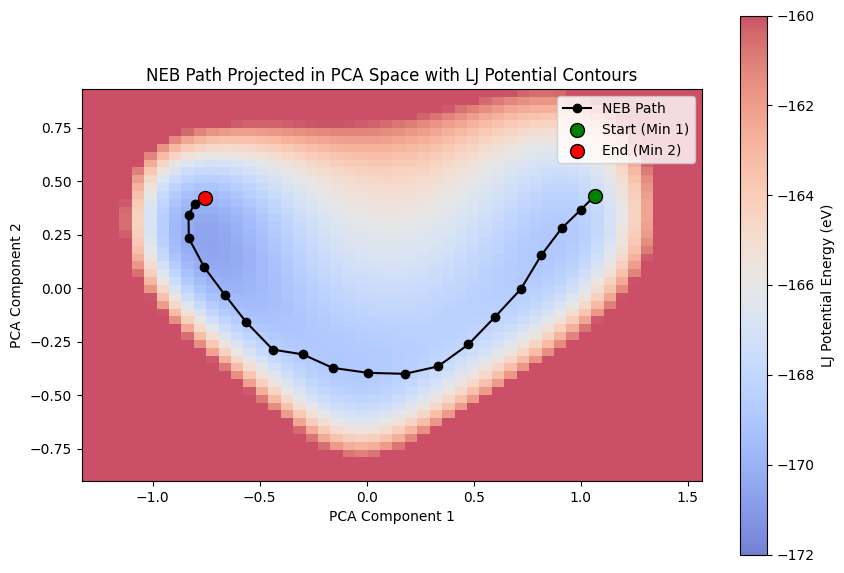

In [10]:
# Plot the contour map of the potential
plt.figure(figsize=(10, 7))
plt.imshow(
    lj_energies,
    cmap="coolwarm",
    alpha=0.7,
    vmin=-172,
    vmax=-160,
    extent=(x_min, x_max, y_min, y_max),
    origin="lower"  # Ensures that the first row of the array is at the bottom.
)

plt.colorbar(label="LJ Potential Energy (eV)")

# Overlay the NEB path (PCA-transformed)
plt.plot(pca_x, pca_y, marker='o', linestyle='-', color="black", label="NEB Path")

# Annotate start and end points
plt.scatter(pca_x[0], pca_y[0], color="green", s=100, label="Start (Min 1)", edgecolors="black", zorder=3)
plt.scatter(pca_x[-1], pca_y[-1], color="red", s=100, label="End (Min 2)", edgecolors="black", zorder=3)

plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("NEB Path Projected in PCA Space with LJ Potential Contours")
plt.legend()
plt.show()


In [11]:
with open("results/9_15_FoundationBAX_LJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_subset_history.pkl", "rb") as f:
    subset_history = np.array(pickle.load(f))
    
with open("results/9_15_FoundationBAX_LJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_acquired_data.pkl", "rb") as f:
    acquired_data = np.array(pickle.load(f))
    
with open("results/9_15_FoundationBAX_LJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_fmax_history.pkl", "rb") as f:
    fmax_history = np.array(pickle.load(f))
    
with open("results/9_15_FoundationBAX_LJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_energy_barrier_history_data.pkl", "rb") as f:
    energy_barrier_history = np.array(pickle.load(f))
    
with open("results/9_15_FoundationBAX_LJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_mae_Nm1_on_N.pkl", "rb") as f:
    mae_Nm1_on_N = np.array(pickle.load(f))
    

In [12]:
def recursive_to_numpy(item):
    """
    Recursively convert all torch.Tensor objects in a nested structure
    (lists, tuples, etc.) to numpy arrays.
    """
    if isinstance(item, torch.Tensor):
        # Ensure that if the tensor is on GPU it is first moved to CPU.
        return item.cpu().numpy()
    elif isinstance(item, list):
        return [recursive_to_numpy(sub_item) for sub_item in item]
    elif isinstance(item, tuple):
        return tuple(recursive_to_numpy(sub_item) for sub_item in item)
    else:
        return item

# Convert the entire nested structure to numpy arrays
#subset_history_numpy = np.array(recursive_to_numpy(subset_history))
#subset_history_numpy = subset_history_numpy[:, :, :7*3]

n_baxitr = subset_history.shape[0]
n_img = subset_history.shape[1]

subset_history_numpy = np.array(subset_history).reshape(n_baxitr, n_img, 38*3)
print(subset_history_numpy.shape)

acquired_data_list = acquired_data.reshape(n_baxitr, 38*3)



(74, 20, 114)


In [13]:
acquired_data.shape

(74, 38, 3)

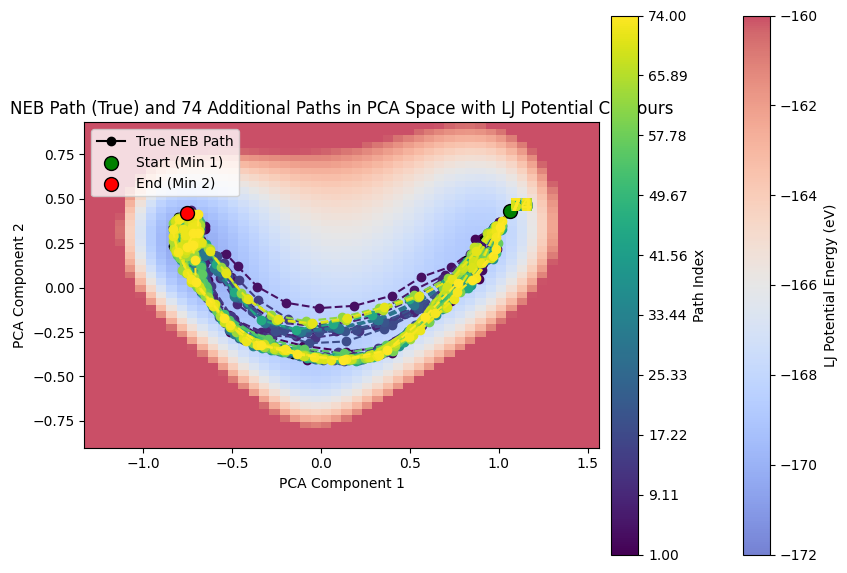

In [14]:
# Assume subset_history_numpy, lj_energies, x_min, x_max, y_min, y_max, pca_x, pca_y, and pca are defined.

# Create a colormap for the paths
num_paths = subset_history_numpy.shape[0]
colors = cm.viridis(np.linspace(0, 1, num_paths))  # Smooth gradient for the paths

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 7))

# Plot the LJ energy contour map (background)
im = ax.imshow(
    lj_energies,
    cmap="coolwarm",
    alpha=0.7,
    vmin=-172,
    vmax=-160,
    extent=(x_min, x_max, y_min, y_max),
    origin="lower"
)
# Add the LJ energy colorbar
fig.colorbar(im, ax=ax, label="LJ Potential Energy (eV)")

# Plot the true NEB path in black with markers
ax.plot(pca_x, pca_y, marker='o', linestyle='-', color="black", label="True NEB Path")
ax.scatter(pca_x[0], pca_y[0], color="green", s=100, label="Start (Min 1)", edgecolors="black", zorder=3)
ax.scatter(pca_x[-1], pca_y[-1], color="red", s=100, label="End (Min 2)", edgecolors="black", zorder=3)

# Plot the additional paths using the smooth gradient colormap
for i, (path, color) in enumerate(zip(subset_history_numpy, colors), start=1):
    path_pca = pca.transform(path)  # Transform the path to PCA space
    ax.plot(path_pca[:, 0], path_pca[:, 1], marker='o', linestyle='--', color=color)
    ax.text(path_pca[0, 0], path_pca[0, 1], f"{i}", fontsize=12,
            fontweight='bold', color=color, zorder=4)

ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title(f"NEB Path (True) and {num_paths} Additional Paths in PCA Space with LJ Potential Contours")
ax.legend(loc='upper left')

# Create a ScalarMappable for the paths colorbar
norm = mcolors.Normalize(vmin=1, vmax=num_paths)
sm = cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])  # Necessary for the colorbar to function properly

# Add the colorbar for the path indices on the side
cbar = fig.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label('Path Index')
cbar.set_ticks(np.linspace(1, num_paths, 10))  # Adjust tick locations as needed

plt.show()


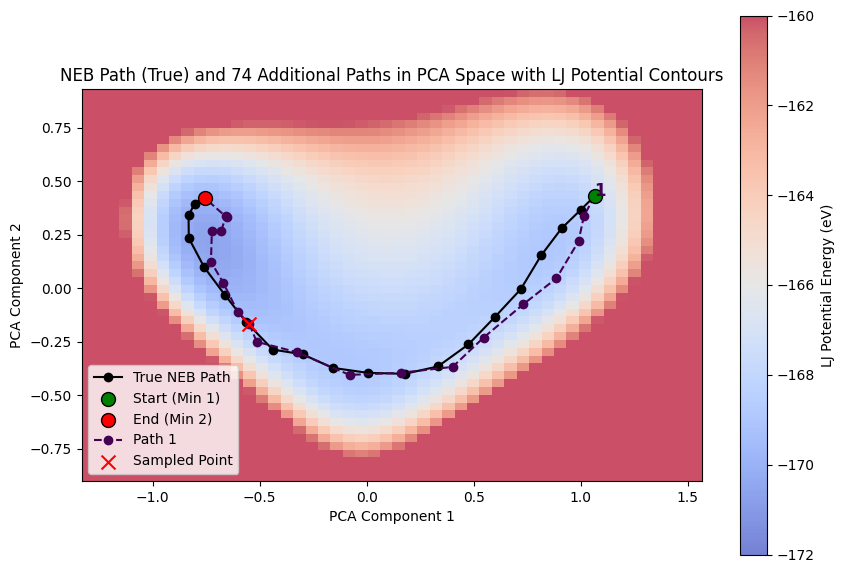

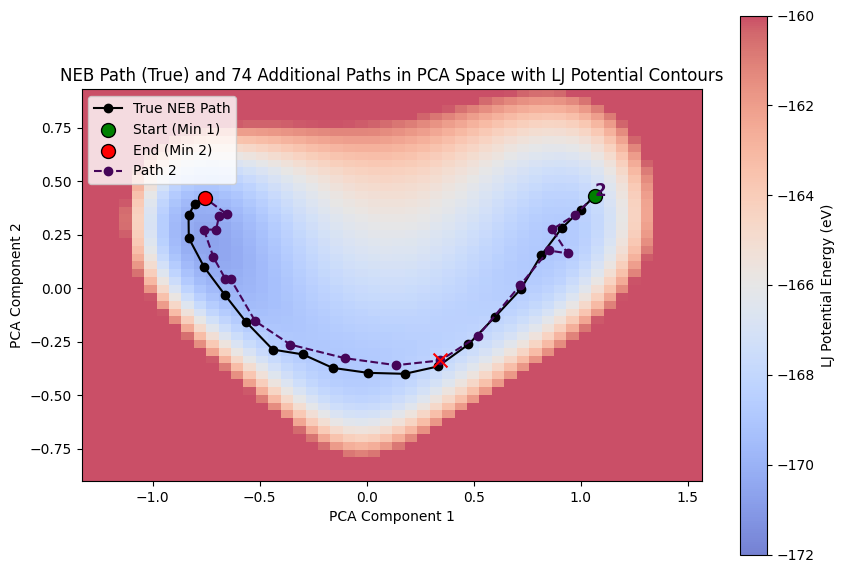

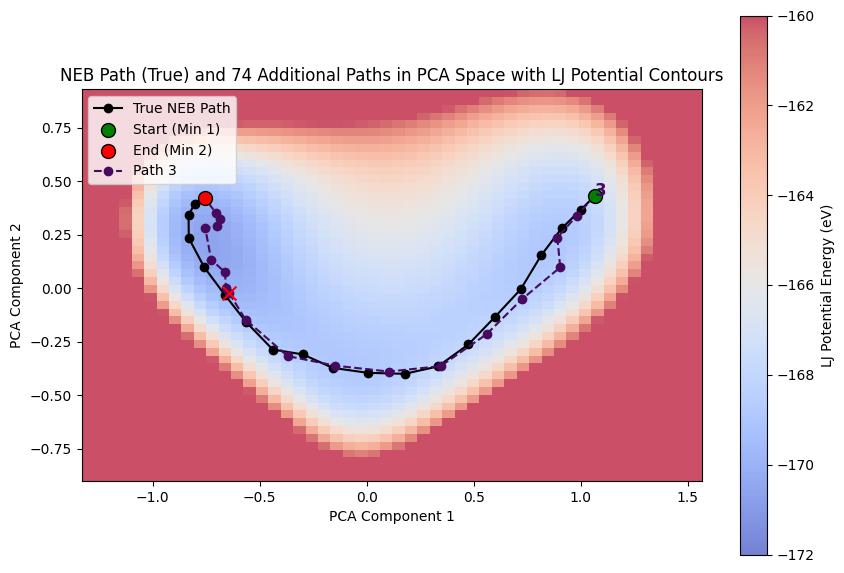

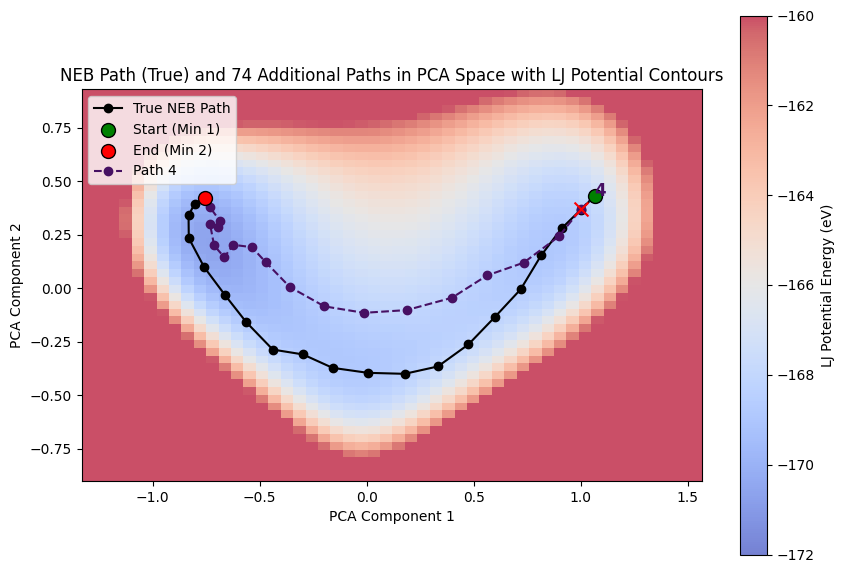

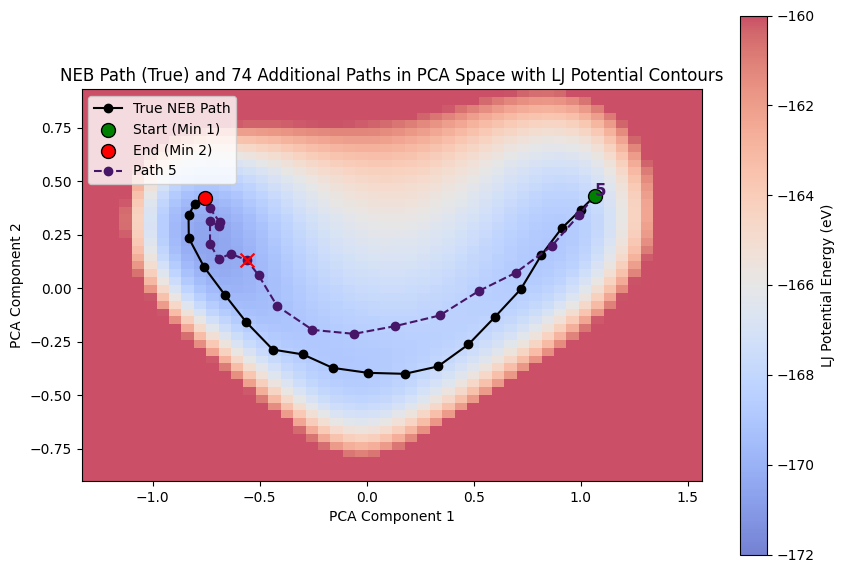

...

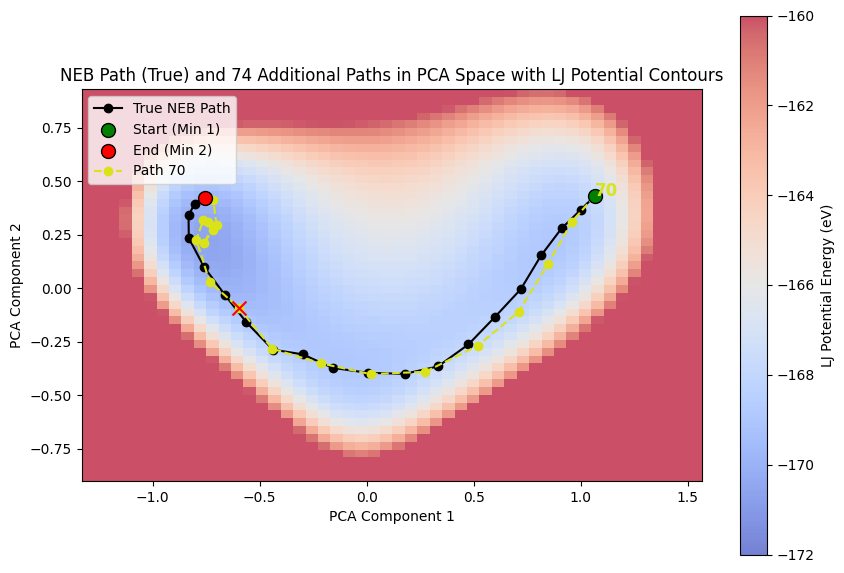

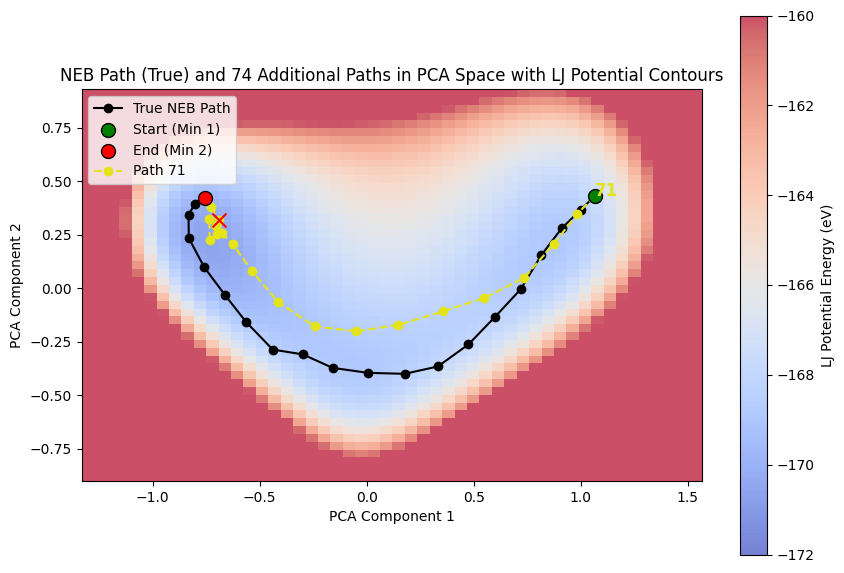

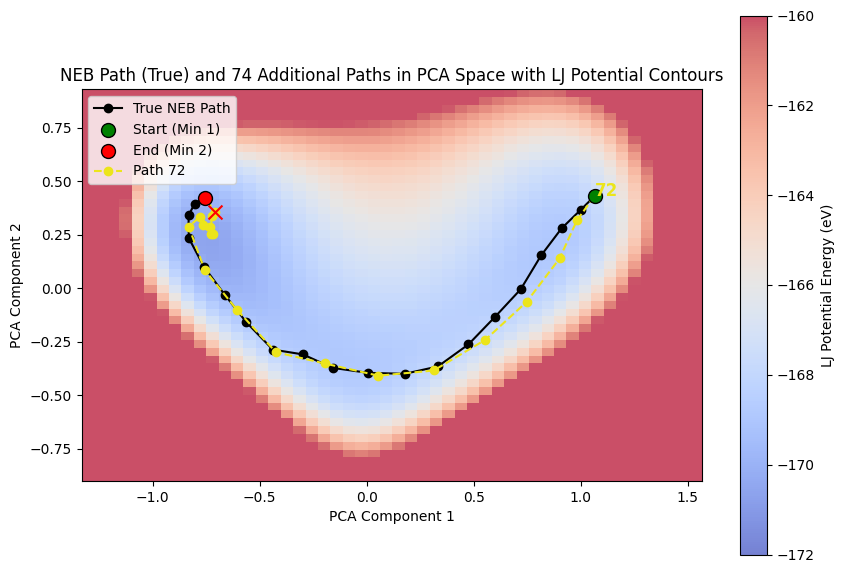

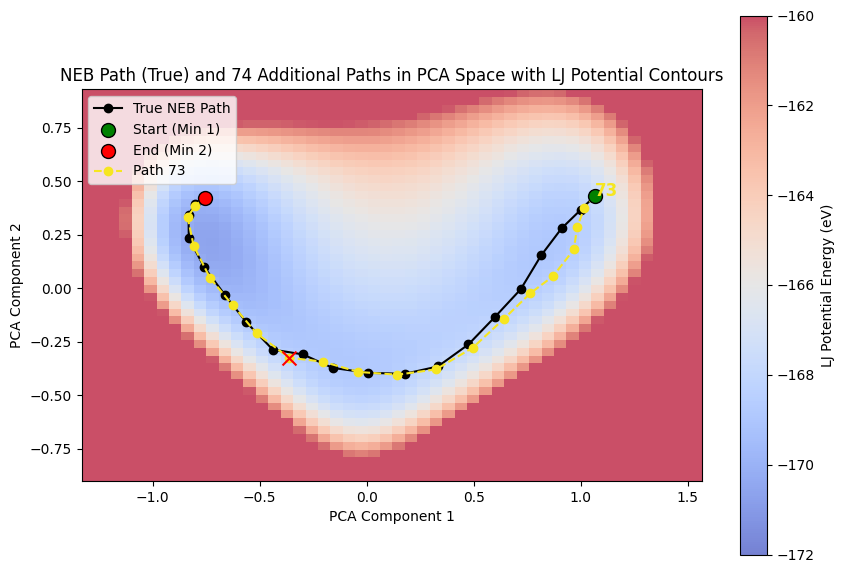

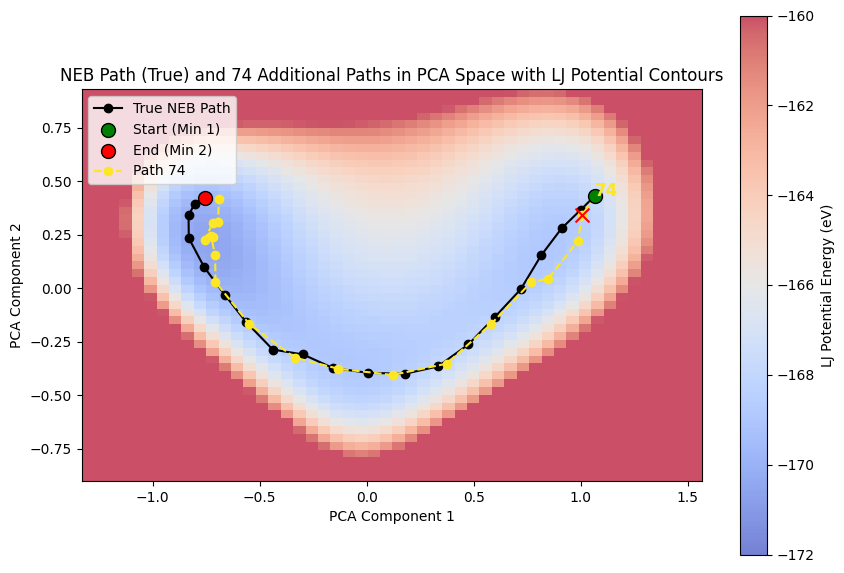

In [15]:
# Create a colormap from a predefined colormap
num_paths = subset_history_numpy.shape[0]
colors = cm.viridis(np.linspace(0, 1, num_paths))  # Smooth gradient from one colormap

# Plot the additional paths using a smooth gradient colormap
for i, (path, color) in enumerate(zip(subset_history_numpy, colors), start=1):
    plt.figure(figsize=(10, 7))
    
    # Plot the LJ energy contour map (background)
    plt.imshow(
        lj_energies,
        cmap="coolwarm",
        alpha=0.7,
        vmin=-172,
        vmax=-160,
        extent=(x_min, x_max, y_min, y_max),
        origin="lower"
    )
    plt.colorbar(label="LJ Potential Energy (eV)")
    
    # Plot the true NEB path in black solid line with markers
    plt.plot(pca_x, pca_y, marker='o', linestyle='-', color="black", label="True NEB Path")
    plt.scatter(pca_x[0], pca_y[0], color="green", s=100, label="Start (Min 1)", edgecolors="black", zorder=3)
    plt.scatter(pca_x[-1], pca_y[-1], color="red", s=100, label="End (Min 2)", edgecolors="black", zorder=3)
    
    # Plot the BAX path in dashed line
    path_pca = pca.transform(path)  # Transform the path to PCA space
    plt.plot(path_pca[:, 0], path_pca[:, 1], marker='o', linestyle='--', 
             label=f"Path {i}", color=color)
    plt.text(path_pca[0, 0], path_pca[0, 1], f"{i}", fontsize=12,
             fontweight='bold', color=color, zorder=4)
    
     # --- New code: Mark the sampled point with a red X ---
    # We skip the first two entries in acquired_data_list.
    # For iteration i, we use the element at index i+1.
    sampled_idx = i-1  # i=1 --> index 2, i=15 --> index 16.
    # From the first element of the tuple/list, take the first 21 numbers as the object's position.
    sampled_point = np.array(acquired_data_list[sampled_idx])
    # Transform the sampled point into PCA space.
    sampled_point_pca = pca.transform(sampled_point.reshape(1, -1))
    # Only add the legend label on the first iteration to avoid duplicates.
    label = "Sampled Point" if i == 1 else None
    plt.scatter(sampled_point_pca[0, 0], sampled_point_pca[0, 1], marker='x', color='red',
                s=100, label=label, zorder=5)
   
 
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title(f"NEB Path (True) and {num_paths} Additional Paths in PCA Space with LJ Potential Contours")
    plt.legend()
    plt.show()


# Energy Barrier Analysis

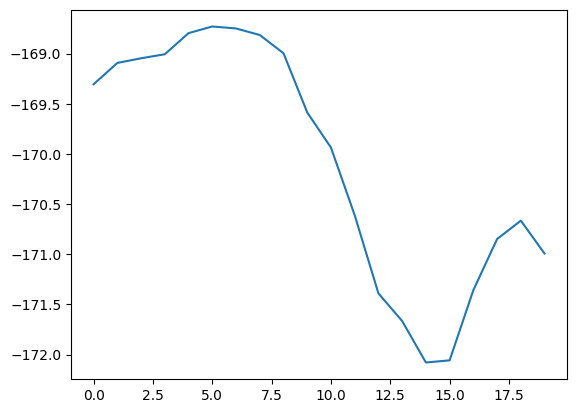

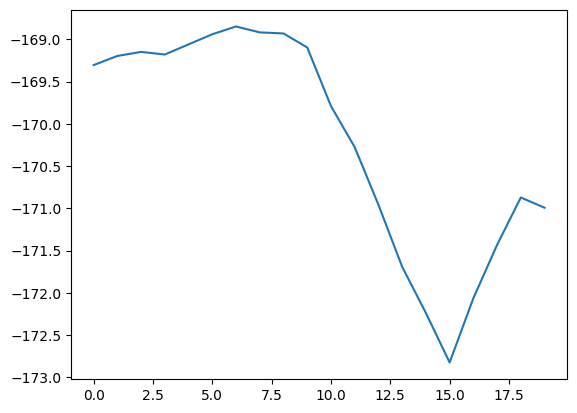

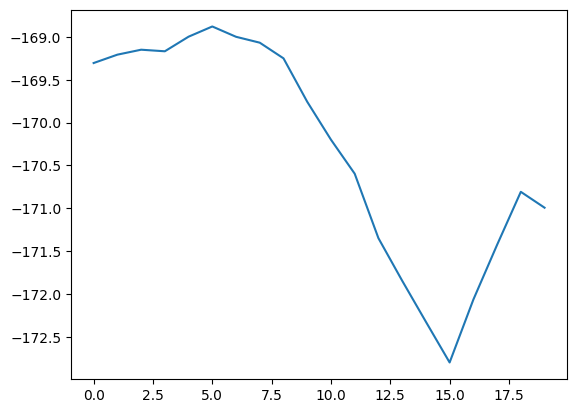

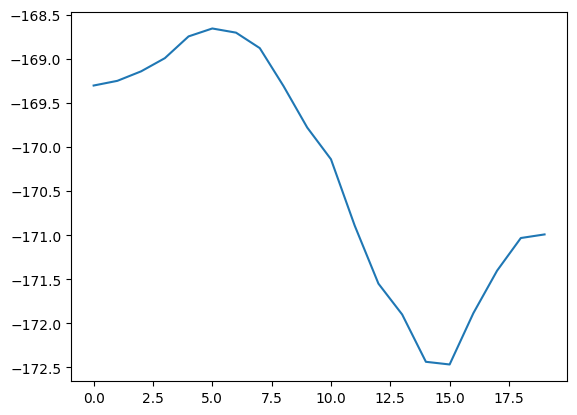

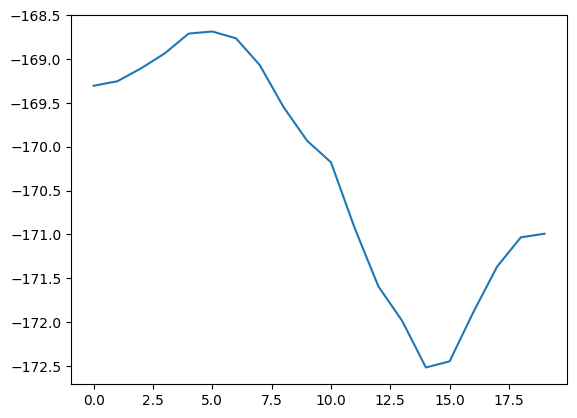

...

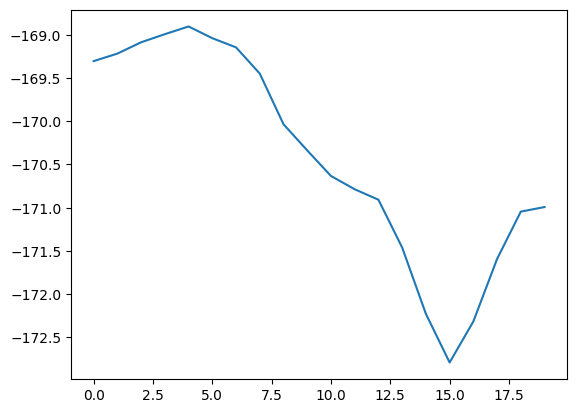

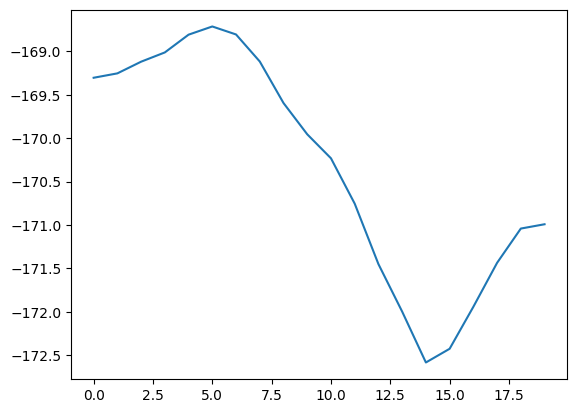

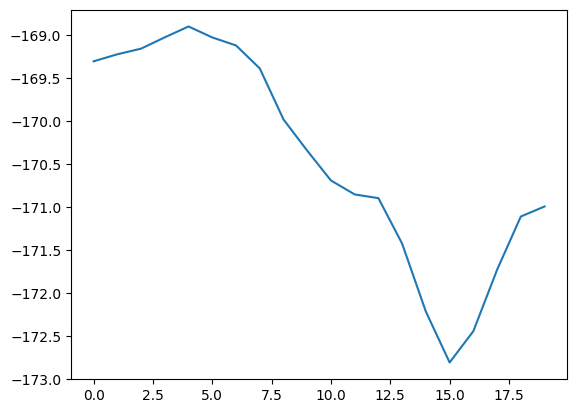

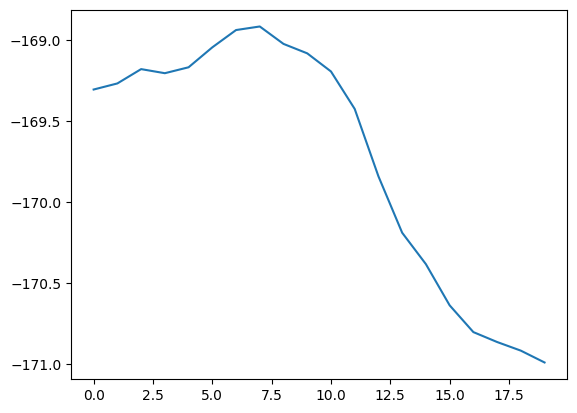

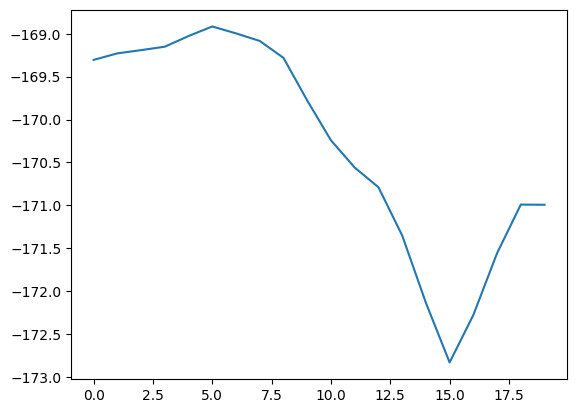

In [16]:
max_E = []
for i in range(len(subset_history_numpy)):
    path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[i]])
    plt.plot(path_energy)
    plt.show()
    max_E.append(np.max(path_energy))

initial_energy = compute_lj_energy(initial_ase.get_positions())
energy_barrier = max_E - initial_energy

path_energy_neb = np.array([compute_lj_energy(pos) for pos in neb_positions])
maxE_neb = np.max(path_energy_neb)

energy_barrier_neb = maxE_neb - initial_energy

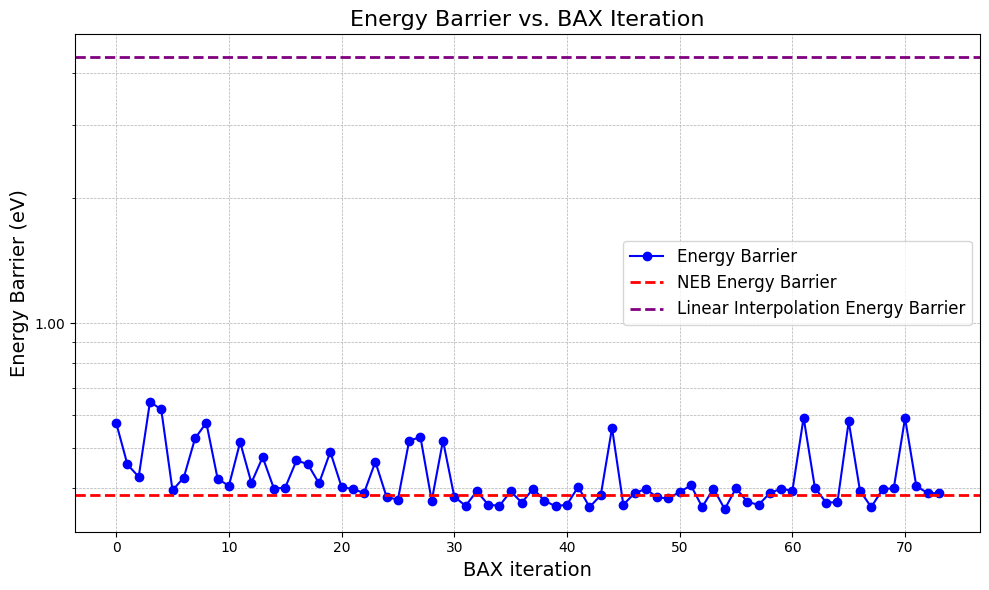

In [17]:
# Compute energy barrier data for the BAX iterations
max_E = []
for i in range(len(subset_history_numpy)):
    path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[i]])
    #plt.plot(path_energy)
    #plt.show()
    max_E.append(np.max(path_energy))

initial_energy = compute_lj_energy(initial_ase.get_positions())
energy_barrier = np.array(max_E) - initial_energy

# Compute the NEB energy barrier
path_energy_neb = np.array([compute_lj_energy(pos) for pos in neb_positions])
maxE_neb = np.max(path_energy_neb)
energy_barrier_neb = maxE_neb - initial_energy

# Compute energy barrier for a linear interpolation between the start and end points
start_pos = initial_ase.get_positions()
end_pos = final_ase.get_positions()
n_interp = 50  # number of interpolation points; adjust as needed
alphas = np.linspace(0, 1, n_interp)
linear_positions = [start_pos + alpha * (end_pos - start_pos) for alpha in alphas]
linear_energy = np.array([compute_lj_energy(pos) for pos in linear_positions])
maxE_linear = np.max(linear_energy)
energy_barrier_linear = maxE_linear - initial_energy

# Plotting the energy barriers
from matplotlib.ticker import ScalarFormatter

plt.figure(figsize=(10, 6))
# Plot the energy barrier data from the BAX iterations
plt.plot(energy_barrier, marker='o', linestyle='-', color='blue', label='Energy Barrier')
#plt.ylim(3, 100)
plt.yscale('log')
# Add a horizontal red dashed line for the NEB energy barrier
plt.axhline(energy_barrier_neb, color='red', linestyle='--', linewidth=2, label='NEB Energy Barrier')

# Add a horizontal purple dashed line for the linear interpolation energy barrier
plt.axhline(energy_barrier_linear, color='purple', linestyle='--', linewidth=2, label='Linear Interpolation Energy Barrier')

plt.xlabel("BAX iteration", fontsize=14)
plt.ylabel("Energy Barrier (eV)", fontsize=14)
plt.title("Energy Barrier vs. BAX Iteration", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)

# Disable scientific notation on the y-axis
ax = plt.gca()
ax.get_yaxis().set_major_formatter(ScalarFormatter(useOffset=False))

plt.tight_layout()
plt.show()


In [18]:
min(energy_barrier), energy_barrier_neb, np.argmin(energy_barrier)

(0.3565209389771269, 0.38555818435634137, 54)

# Real v. Predicted Energy Barrier

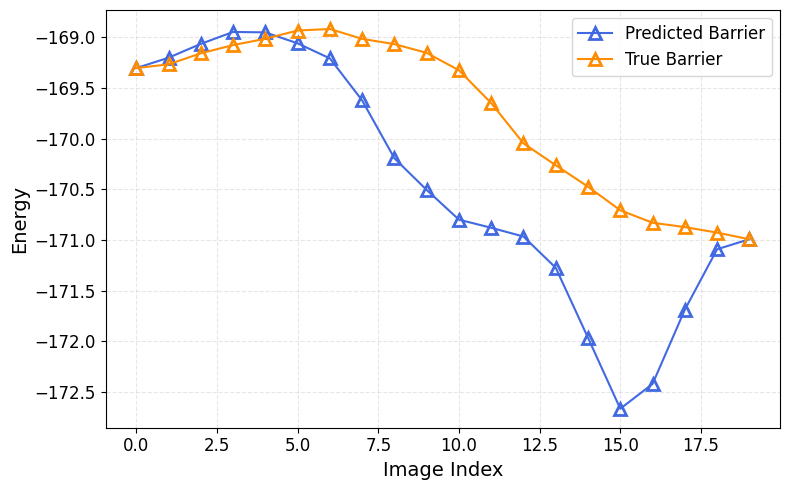

In [19]:
best_index = np.argmin(energy_barrier)
#best_index = 45

# Compute predicted path energies
path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[best_index]])

# Plotting
plt.figure(figsize=(8, 5))
plt.plot(path_energy, '^-', label='Predicted Barrier', color='royalblue',
         markerfacecolor='none', markeredgewidth=2, markersize=8)
plt.plot(energies, '^-', label='True Barrier', color='darkorange',
         markerfacecolor='none', markeredgewidth=2, markersize=8)

plt.xlabel("Image Index", fontsize=14)
plt.ylabel("Energy", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


# Classical NEB v. BAX NEB

      Step     Time          Energy          fmax
FIRE:    0 10:56:59     -164.907359       14.487974
FIRE:    1 10:56:59     -166.254374        6.877305
FIRE:    2 10:56:59     -166.677119        8.612043
FIRE:    3 10:56:59     -166.868307        5.571544
FIRE:    4 10:56:59     -167.267543        2.238904
FIRE:    5 10:57:00     -167.254754        5.108893
FIRE:    6 10:57:00     -167.359685        3.750955
FIRE:    7 10:57:00     -167.477788        1.890605
FIRE:    8 10:57:00     -167.525967        1.862706
FIRE:    9 10:57:00     -167.523995        3.130986
FIRE:   10 10:57:00     -167.535049        2.937933
FIRE:   11 10:57:00     -167.554827        2.564936
FIRE:   12 10:57:01     -167.579327        2.040776
FIRE:   13 10:57:01     -167.604046        1.419715
FIRE:   14 10:57:01     -167.625381        1.340712
FIRE:   15 10:57:01     -167.641959        1.370087
FIRE:   16 10:57:01     -167.655222        1.447081
FIRE:   17 10:57:01     -167.669900        1.519822
FIRE:   18 10:

FIRE:  157 10:57:21     -168.916897        1.402903
FIRE:  158 10:57:21     -168.919959        0.793134
FIRE:  159 10:57:21     -168.923940        1.493340
FIRE:  160 10:57:21     -168.928843        0.680223
FIRE:  161 10:57:21     -168.934730        1.965626
FIRE:  162 10:57:22     -168.938629        1.382615
FIRE:  163 10:57:22     -168.938167        1.135559
FIRE:  164 10:57:22     -168.937405        2.153782
FIRE:  165 10:57:22     -168.935781        5.432228
FIRE:  166 10:57:22     -168.937540        0.800847
FIRE:  167 10:57:22     -168.936798        5.275317
FIRE:  168 10:57:22     -168.937691        3.813243
FIRE:  169 10:57:22     -168.938621        1.369207
FIRE:  170 10:57:23     -168.939019        1.295226
FIRE:  171 10:57:23     -168.939186        1.214510
FIRE:  172 10:57:23     -168.939338        1.056763
FIRE:  173 10:57:23     -168.939488        0.832984
FIRE:  174 10:57:23     -168.939641        0.778464
FIRE:  175 10:57:23     -168.939796        0.776184
FIRE:  176 1

FIRE:  315 10:57:43     -168.908699        0.741585
FIRE:  316 10:57:43     -168.908526        0.543320
FIRE:  317 10:57:43     -168.908389        0.771283
FIRE:  318 10:57:43     -168.908312        0.578565
FIRE:  319 10:57:43     -168.908320        0.781694
FIRE:  320 10:57:44     -168.908464        0.720729
FIRE:  321 10:57:44     -168.908855        0.785256
FIRE:  322 10:57:44     -168.909739        0.924975
FIRE:  323 10:57:44     -168.911557        0.923205
FIRE:  324 10:57:44     -168.914970        1.028378
FIRE:  325 10:57:44     -168.920539        2.483910
FIRE:  326 10:57:44     -168.928293        7.697884
FIRE:  327 10:57:45     -168.925135        0.859284
FIRE:  328 10:57:45     -168.924969        0.768334
FIRE:  329 10:57:45     -168.924843        0.778338
FIRE:  330 10:57:45     -168.924764        0.811871
FIRE:  331 10:57:45     -168.924705        0.814226
FIRE:  332 10:57:45     -168.924663        0.785250
FIRE:  333 10:57:45     -168.924640        0.728881
FIRE:  334 1

FIRE:  473 10:58:05     -168.915142        1.404144
FIRE:  474 10:58:05     -168.912157        1.887165
FIRE:  475 10:58:05     -168.908575        2.808698
FIRE:  476 10:58:06     -168.905348        4.241798
FIRE:  477 10:58:06     -168.904782        9.232847
FIRE:  478 10:58:06     -168.908680        5.340662
FIRE:  479 10:58:06     -168.915291        5.373874
FIRE:  480 10:58:06     -168.918532        5.763762
FIRE:  481 10:58:06     -168.917326        4.513244
FIRE:  482 10:58:06     -168.914289        3.875585
FIRE:  483 10:58:07     -168.912419        3.266493
FIRE:  484 10:58:07     -168.911121        2.508392
FIRE:  485 10:58:07     -168.909983        2.493345
FIRE:  486 10:58:07     -168.908887        2.580918
FIRE:  487 10:58:07     -168.907876        2.557320
FIRE:  488 10:58:07     -168.907079        2.396503
FIRE:  489 10:58:07     -168.906692        2.126704
FIRE:  490 10:58:08     -168.907029        1.823691
FIRE:  491 10:58:08     -168.908672        1.871036
FIRE:  492 1

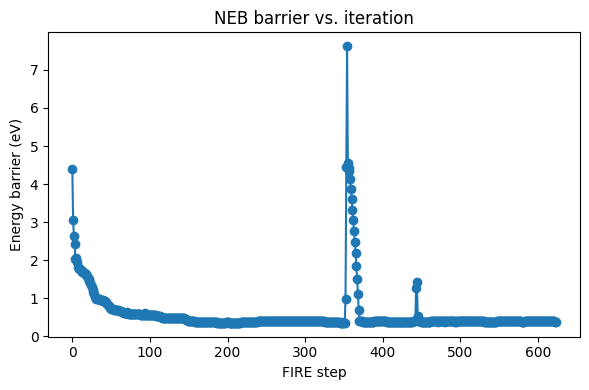

In [20]:
import copy
import numpy as np
import matplotlib.pyplot as plt
from ase.neb import NEB
from ase.optimize import FIRE

# … your existing setup …
ase0 = copy.deepcopy(test[0])
ase0.set_calculator(copy.deepcopy(ase_calculator))
aseN = copy.deepcopy(test[1])
aseN.set_calculator(copy.deepcopy(ase_calculator))

n_images = 20
images = [ase0]
for i in range(1, n_images-1):
    img = ase0.copy()
    img.set_calculator(copy.deepcopy(ase_calculator))
    images.append(img)
images.append(aseN)

neb = NEB(images, climb=False, remove_rotation_and_translation=True, method='string')
neb.interpolate(method='linear')
optimizer = FIRE(neb)

# prepare a list to store barrier vs step
barriers = []

def record_barrier():
    energies = [img.get_potential_energy() for img in images]
    barrier = max(energies) - energies[0]
    barriers.append(barrier)

# attach the recorder to run at every step
optimizer.attach(record_barrier, interval=1)

# run NEB
optimizer.run(fmax=0.1, steps=1000)

# now plot
plt.figure(figsize=(6,4))
plt.plot(barriers, marker='o', linestyle='-')
plt.xlabel('FIRE step')
plt.ylabel('Energy barrier (eV)')
plt.title('NEB barrier vs. iteration')
plt.tight_layout()
plt.show()


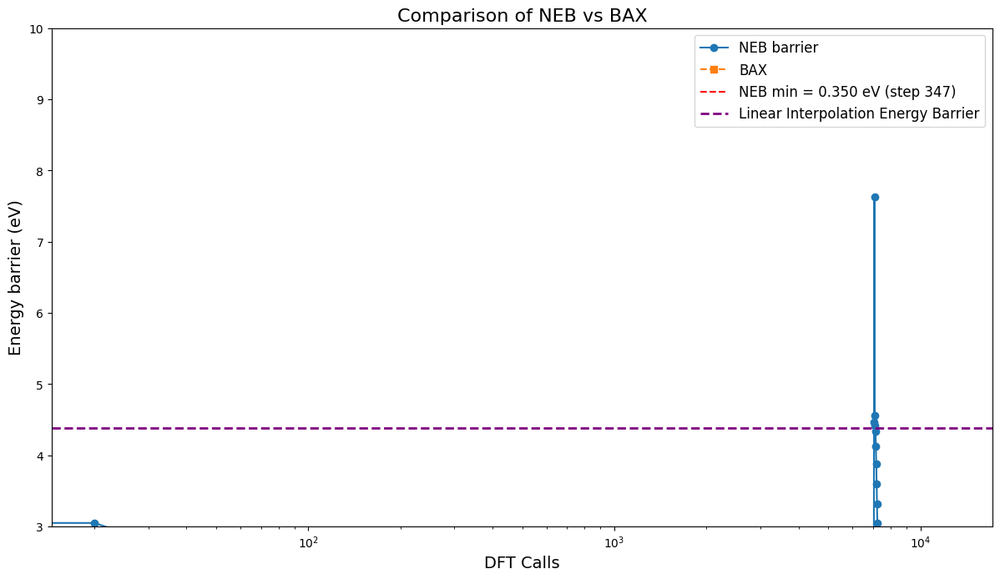

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# assume `barriers` and `energy_barrier` are your two lists

# NEB data
x_neb = np.arange(len(barriers))*20            # steps 0,1,2,...
y_neb = np.array(barriers)

# other process, scaled x by 30
x_other = np.arange(len(energy_barrier))+20   # steps 0→0, 1→30, 2→60, ...
y_other = np.array(energy_barrier)

# find NEB minimum
min_val  = y_neb.min()
min_step = y_neb.argmin()

plt.figure(figsize=(12, 7))

# plot NEB barrier
plt.plot(x_neb, y_neb, marker='o', linestyle='-', label='NEB barrier')

# plot other energy barrier
plt.plot(x_other, y_other, marker='s', linestyle='--', label='BAX')

# red dashed min line (for NEB)
plt.axhline(min_val, color='red', linestyle='--',
            label=f'NEB min = {min_val:.3f} eV (step {min_step})')
plt.axhline(energy_barrier_linear, color='purple', linestyle='--', linewidth=2, label='Linear Interpolation Energy Barrier')

plt.scatter(min_step, min_val, color='red', zorder=5)

plt.xlabel('DFT Calls', fontsize=14)
plt.ylabel('Energy barrier (eV)', fontsize=14)
plt.title('Comparison of NEB vs BAX', fontsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
#plt.yscale('log')
plt.xscale('log')
plt.ylim(3, 10)
plt.show()


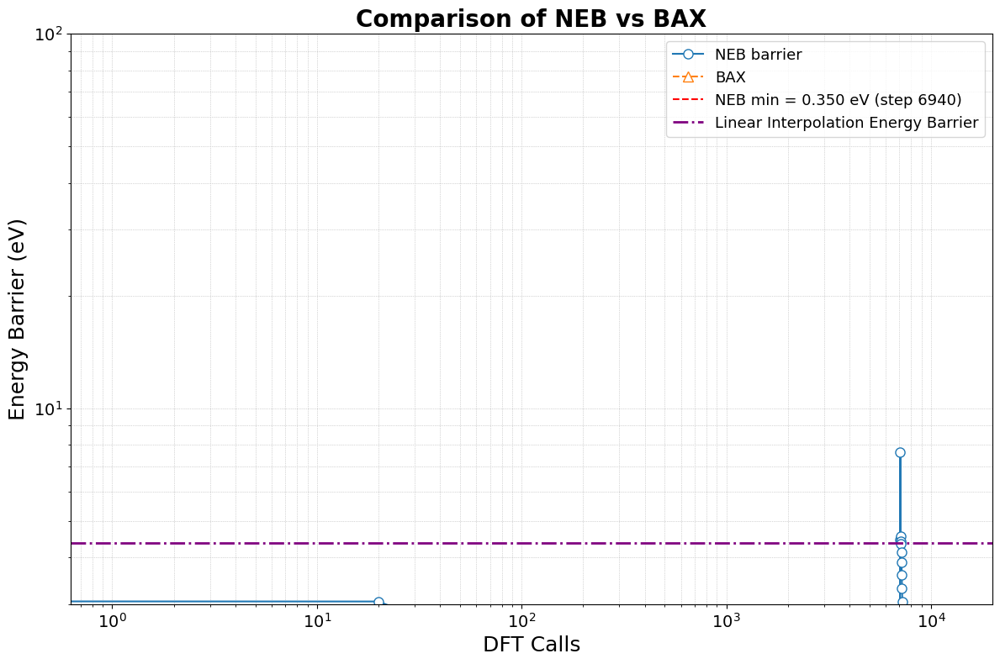

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# assume `barriers`, `energy_barrier`, and `energy_barrier_linear` are defined

# NEB data
x_neb = np.arange(len(barriers)) * 20
y_neb = np.array(barriers)

# BAX data
x_other = np.arange(len(energy_barrier)) 
y_other = np.array(energy_barrier)

# NEB minimum
min_val = y_neb.min()
min_step = x_neb[y_neb.argmin()]  # get x value, not index

plt.figure(figsize=(12, 8))

# Plot NEB
plt.plot(x_neb, y_neb, marker='o', linestyle='-', color='#1f77b4',
         markersize=8, label='NEB barrier', markerfacecolor='white')

# Plot BAX
plt.plot(x_other, y_other, marker='^', linestyle='--', color='#ff7f0e',
         markersize=8, label='BAX', markerfacecolor='white')

# NEB min line
plt.axhline(min_val, color='red', linestyle='--', linewidth=1.5,
            label=f'NEB min = {min_val:.3f} eV (step {min_step})')

# Linear interpolation barrier
plt.axhline(energy_barrier_linear, color='purple', linestyle='-.',
            linewidth=2, label='Linear Interpolation Energy Barrier')

# Highlight minimum point
plt.scatter(min_step, min_val, color='red', edgecolors='black',
            zorder=5, s=100)

# Labels and title
plt.xlabel('DFT Calls', fontsize=18)
plt.ylabel('Energy Barrier (eV)', fontsize=18)
plt.title('Comparison of NEB vs BAX', fontsize=20, weight='bold')

# Axes settings
plt.xscale('log')
#plt.xlim(10, 1000)
plt.ylim(3, 100)
plt.yscale('log')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Legend
plt.legend(fontsize=13, loc='best', frameon=True)

plt.grid(True, which='both', linestyle=':', linewidth=0.5)
plt.tight_layout()
plt.show()


In [23]:
#could do a linear interp to check energy barrier isn't ACTUALLY better

# Convergence Analysis

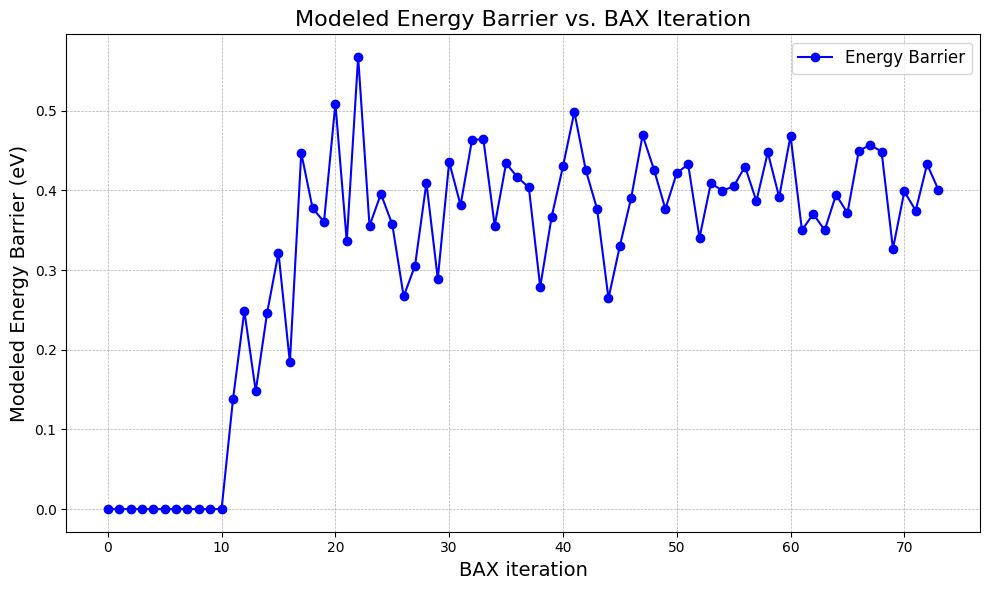

In [24]:
plt.figure(figsize=(10, 6))
# Plot the energy barrier data from the BAX iterations
plt.plot(energy_barrier_history, marker='o', linestyle='-', color='blue', label='Energy Barrier')
#plt.ylim(0.2, 0.4)
#plt.yscale('log')
plt.xlabel("BAX iteration", fontsize=14)
plt.ylabel("Modeled Energy Barrier (eV)", fontsize=14)
plt.title("Modeled Energy Barrier vs. BAX Iteration", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)

# Disable scientific notation on the y-axis
ax = plt.gca()
ax.get_yaxis().set_major_formatter(ScalarFormatter(useOffset=False))

plt.tight_layout()
plt.show()


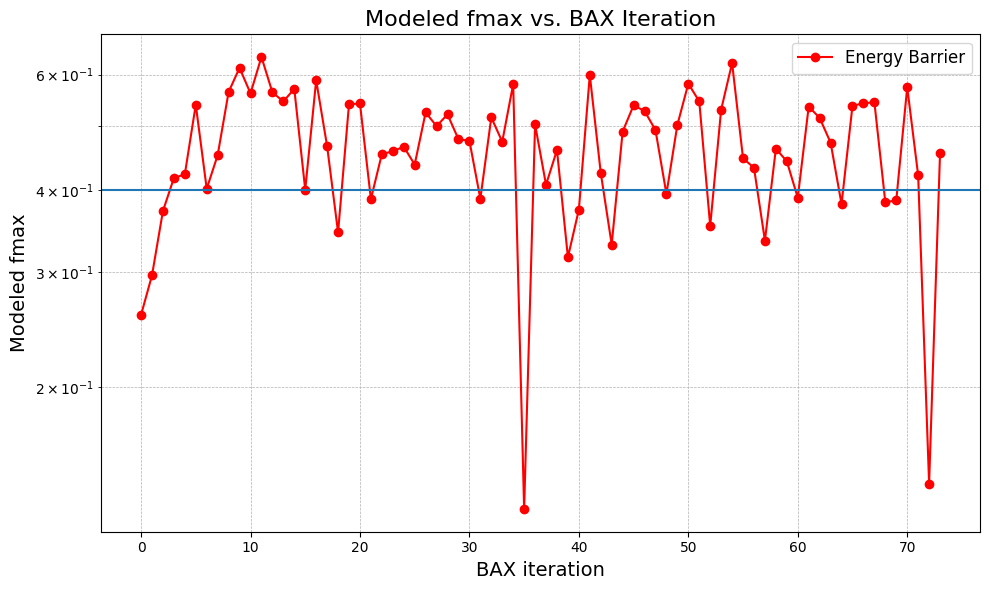

In [25]:
plt.figure(figsize=(10, 6))
# Plot the energy barrier data from the BAX iterations
plt.plot(fmax_history, marker='o', linestyle='-', color='red', label='Energy Barrier')
#plt.ylim(0, 2)
plt.yscale('log')
plt.xlabel("BAX iteration", fontsize=14)
plt.ylabel("Modeled fmax", fontsize=14)
plt.title("Modeled fmax vs. BAX Iteration", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axhline(0.4)
plt.legend(fontsize=12)

# Disable scientific notation on the y-axis
ax = plt.gca()
ax.get_yaxis().set_major_formatter(ScalarFormatter(useOffset=False))

plt.tight_layout()
plt.show()


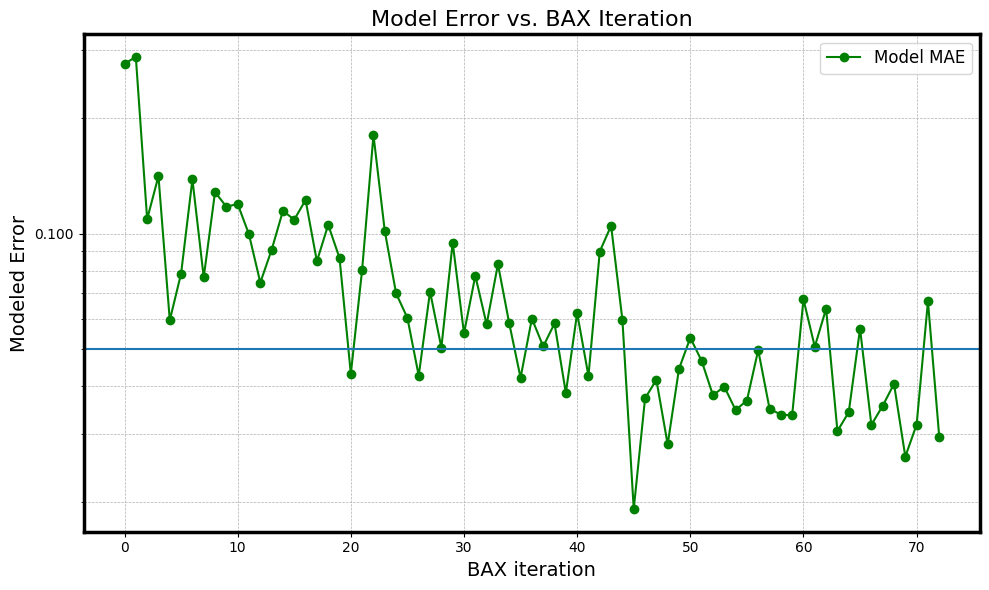

In [61]:
plt.figure(figsize=(10, 6))
# Plot the energy barrier data from the BAX iterations
plt.plot(mae_Nm1_on_N, marker='o', linestyle='-', color='green', label='Model MAE')
#plt.ylim(0.2, 0.4)
plt.yscale('log')
plt.xlabel("BAX iteration", fontsize=14)
plt.ylabel("Modeled Error", fontsize=14)
plt.title("Model Error vs. BAX Iteration", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)
plt.axhline(0.05)

# Disable scientific notation on the y-axis
ax = plt.gca()
ax.get_yaxis().set_major_formatter(ScalarFormatter(useOffset=False))

plt.tight_layout()
plt.show()


# Robust Convergence Criterion

In [63]:
thresh_mae = 0.1
thresh_fmax = 0.2
patience_num = 2

converged_indices = []

for i in range(len(mae_Nm1_on_N)):
    if mae_Nm1_on_N[i] < thresh_mae and fmax_history[i] < thresh_fmax:
        converged_indices.append(i)
        
converged_index = converged_indices[patience_num-1]
print(converged_indices)
print(converged_index)

converged_index = 72

[35, 72]
72


In [59]:
len(mae_Nm1_on_N)

73

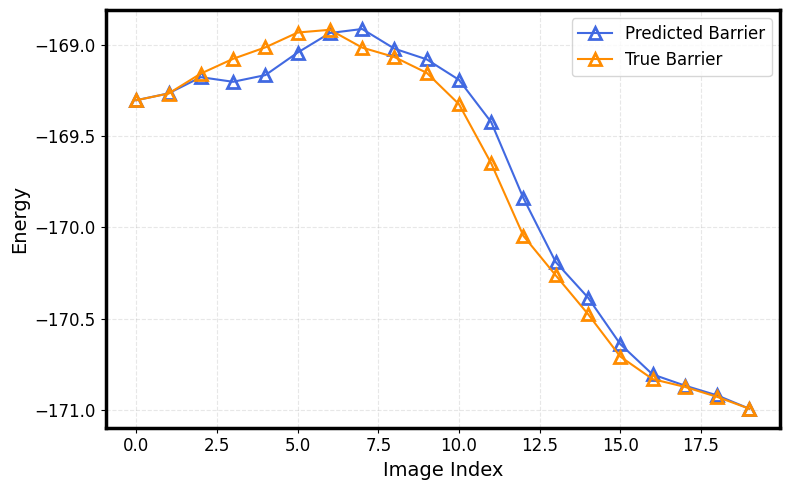

In [66]:

# Compute predicted path energies
path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[converged_index]])

# Plotting
plt.figure(figsize=(8, 5))
plt.plot(path_energy, '^-', label='Predicted Barrier', color='royalblue',
         markerfacecolor='none', markeredgewidth=2, markersize=8)
plt.plot(energies, '^-', label='True Barrier', color='darkorange',
         markerfacecolor='none', markeredgewidth=2, markersize=8)

plt.xlabel("Image Index", fontsize=14)
plt.ylabel("Energy", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


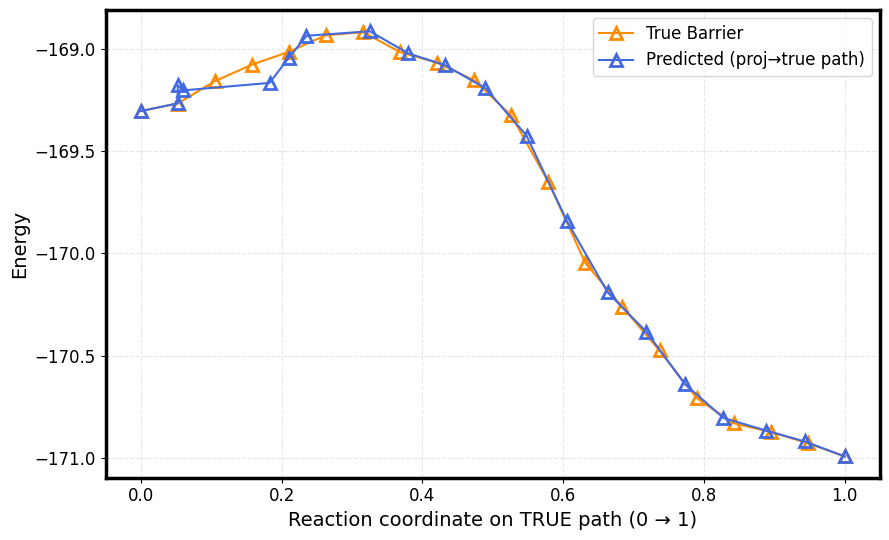

[diagnostics] mean ⟂ distance to true path: 1.1066e-01  |  max: 4.7040e-01


In [67]:
import numpy as np
import matplotlib.pyplot as plt

# --------- Utilities ---------
def flatten_positions(positions):
    """positions: (N, n_atoms, 3) or (N, D) -> (N, D)"""
    P = np.asarray(positions)
    return P.reshape(P.shape[0], -1)

def reaction_coordinate_from_polyline(T):
    """
    True path cumulative arc length and normalized coordinate.
    T: (M, D) flattened true positions
    Returns:
        S: (M,) cumulative arc length with S[0]=0
        t_true: (M,) normalized in [0,1]
        seg_len: (M-1,) segment lengths
    """
    seg = np.linalg.norm(np.diff(T, axis=0), axis=1)
    S = np.concatenate([[0.0], np.cumsum(seg)])
    total = S[-1]
    t_true = S / total if total > 0 else np.linspace(0, 1, len(T))
    return S, t_true, seg

def project_points_onto_polyline(P, T, S, seg_len):
    """
    Project each point p in P onto the polyline defined by T (nodes) and segments.
    Returns:
        t_pred: (N,) normalized reaction coordinate (0..1) for each P[i]
        d_pred: (N,) closest distance to the polyline (useful for diagnostics)
        idx_seg: (N,) segment index chosen for each projection
    """
    N = P.shape[0]
    M = T.shape[0] - 1
    if M <= 0:
        # Degenerate true path: map all to 0..1 by index
        return np.linspace(0, 1, N), np.zeros(N), np.zeros(N, dtype=int)

    # Precompute segment vectors and squared norms
    V = T[1:] - T[:-1]            # (M, D)
    VV = np.einsum('md,md->m', V, V)  # (M,)

    t_pred = np.empty(N, dtype=float)
    d_pred = np.empty(N, dtype=float)
    idx_seg = np.empty(N, dtype=int)

    total_len = S[-1] if S[-1] > 0 else 1.0

    # For each predicted point, find the closest projection onto any segment
    for i in range(N):
        p = P[i]  # (D,)
        # Compute per-segment projection parameters alpha before clamping
        # alpha = ((p - T_k) · V_k) / (||V_k||^2)
        W = p - T[:-1]                         # (M, D)
        num = np.einsum('md,md->m', W, V)      # (M,)
        alpha = np.zeros_like(num)
        nonzero = VV > 0
        alpha[nonzero] = num[nonzero] / VV[nonzero]
        alpha = np.clip(alpha, 0.0, 1.0)       # clamp to segment

        # Projections and distances
        proj = T[:-1] + alpha[:, None] * V     # (M, D)
        dist2 = np.einsum('md,md->m', (p - proj), (p - proj))  # (M,)

        k = np.argmin(dist2)                   # best segment
        idx_seg[i] = k
        d_pred[i] = np.sqrt(dist2[k])
        s_proj = S[k] + alpha[k] * seg_len[k]  # arc length where it lands
        t_pred[i] = s_proj / total_len

    return t_pred, d_pred, idx_seg

# --------- Inputs you already have ----------
# Predicted path positions and energy
pred_positions = np.asarray(subset_history_numpy[converged_index])        # (N_pred, n_atoms, 3) or (N_pred, D)
path_energy_pred = np.array([compute_lj_energy(pos) for pos in pred_positions])

# True path positions from ASE images
true_positions = np.array([atoms.get_positions() for atoms in images_ase])  # (N_true, n_atoms, 3)
# Use existing energies if defined; else compute from calculators attached to images_ase
try:
    energies_true  # optional: maybe you named it `energies`
    path_energy_true = np.asarray(energies_true)
except NameError:
    try:
        energies  # your earlier variable name
        path_energy_true = np.asarray(energies)
    except NameError:
        path_energy_true = np.array([img.get_potential_energy() for img in images_ase])

# --------- Compute coordinates ----------
T = flatten_positions(true_positions)            # (M, D)
P = flatten_positions(pred_positions)            # (N, D)

S_true, x_true, seg_len = reaction_coordinate_from_polyline(T)
x_pred_proj, d_pred, idx_seg = project_points_onto_polyline(P, T, S_true, seg_len)

# (Optional) sort predicted points by projected coordinate for nicer lines
order = np.argsort(x_pred_proj)
x_pred_sorted = x_pred_proj[order]
y_pred_sorted = path_energy_pred[order]

# --------- Plot ----------
plt.figure(figsize=(9, 5.5))
# True path vs its own coordinate
plt.plot(x_true, path_energy_true, '^-', label='True Barrier',
         color='darkorange', markerfacecolor='none', markeredgewidth=2, markersize=8)

# Predicted energies vs *projected* coordinate on the true path
plt.plot(x_pred_sorted, y_pred_sorted, '^-', label='Predicted (proj→true path)',
         color='royalblue', markerfacecolor='none', markeredgewidth=2, markersize=8)

plt.xlabel("Reaction coordinate on TRUE path (0 → 1)", fontsize=14)
plt.ylabel("Energy", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# --------- (Optional) Diagnostics ----------
# Mean and max perpendicular mismatch between predicted points and the true path
print(f"[diagnostics] mean ⟂ distance to true path: {d_pred.mean():.4e}  |  max: {d_pred.max():.4e}")


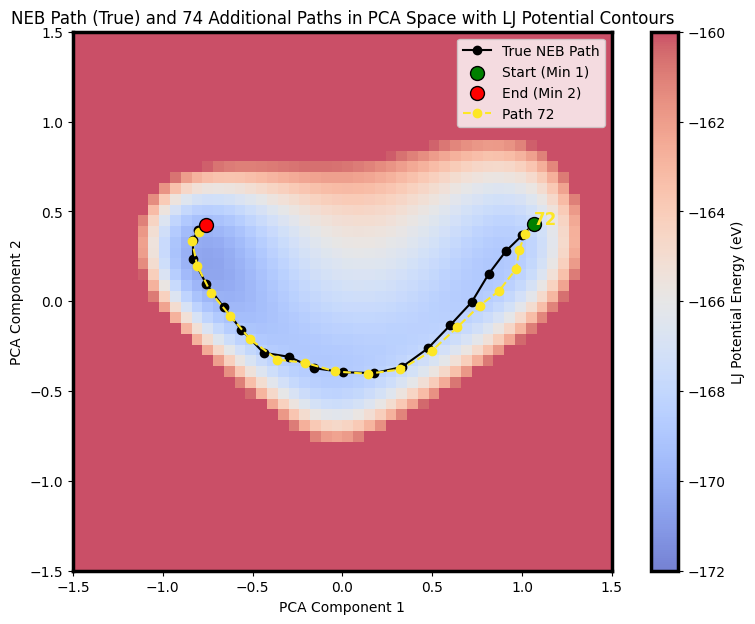

In [68]:
i = converged_index
path = subset_history_numpy[converged_index]


plt.figure(figsize=(10, 7))
    
# Plot the LJ energy contour map (background)
plt.imshow(
    lj_energies,
    cmap="coolwarm",
    alpha=0.7,
    vmin=-172,
        vmax=-160,
    extent=(x_min, x_max, y_min, y_max),
    origin="lower"
)
plt.colorbar(label="LJ Potential Energy (eV)")

# Plot the true NEB path in black solid line with markers
plt.plot(pca_x, pca_y, marker='o', linestyle='-', color="black", label="True NEB Path")
plt.scatter(pca_x[0], pca_y[0], color="green", s=100, label="Start (Min 1)", edgecolors="black", zorder=3)
plt.scatter(pca_x[-1], pca_y[-1], color="red", s=100, label="End (Min 2)", edgecolors="black", zorder=3)

# Plot the BAX path in dashed line
path_pca = pca.transform(path)  # Transform the path to PCA space
plt.plot(path_pca[:, 0], path_pca[:, 1], marker='o', linestyle='--', 
         label=f"Path {i}", color=color)
plt.text(path_pca[0, 0], path_pca[0, 1], f"{i}", fontsize=12,
         fontweight='bold', color=color, zorder=4)


plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title(f"NEB Path (True) and {num_paths} Additional Paths in PCA Space with LJ Potential Contours")
plt.legend()
plt.show()


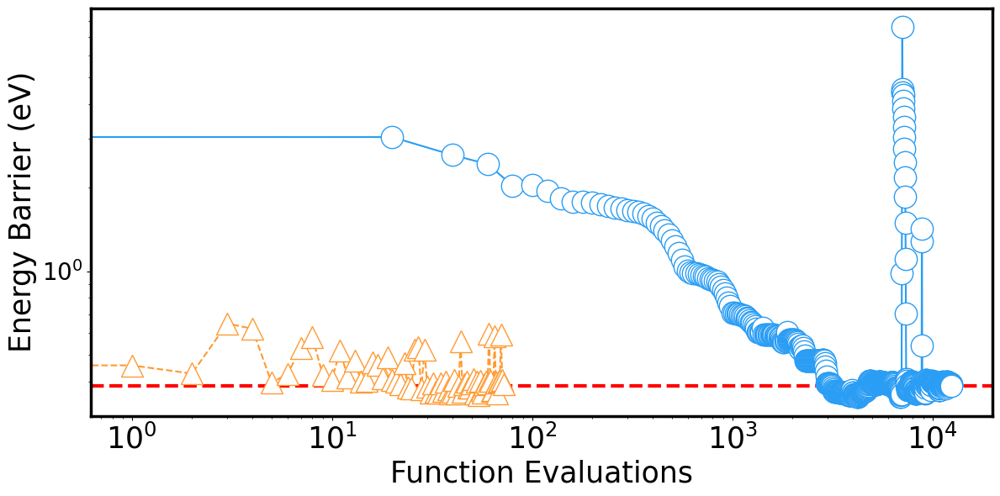

In [69]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['axes.linewidth'] = 2.5

# assume `barriers`, `energy_barrier`, and `energy_barrier_linear` are defined

# NEB data
x_neb = np.arange(len(barriers)) * 20
y_neb = np.array(barriers)

# BAX data
x_other = np.arange(len(energy_barrier))[:converged_index+1]
y_other = np.array(energy_barrier)[:converged_index+1]

# NEB minimum
min_val = y_neb[-1]
min_step = x_neb[y_neb.argmin()]  # get x value, not index

plt.figure(figsize=(12, 6))

# NEB min line
plt.axhline(min_val, color='red', linestyle='--', linewidth=3,
            label=f'NEB min = {min_val:.3f} eV (step {min_step})')

# Plot NEB (brighter blue)
plt.plot(x_neb, y_neb, marker='o', linestyle='-', color='#2a9df4',
         markersize=19, label='NEB Energy Barrier', markerfacecolor='white')

# Plot BAX (brighter orange)
plt.plot(x_other, y_other, marker='^', linestyle='--', color='#ff9a32',
         markersize=19, label='NN-BAX Energy Barrier', markerfacecolor='white')



# Linear interpolation barrier
#plt.axhline(energy_barrier_linear, color='purple', linestyle='-.',
#            linewidth=3, label='Linear Interpolation Energy Barrier')

# Highlight minimum point
#plt.scatter(min_step, min_val, color='red', edgecolors='black',
#            zorder=5, s=100)

# Labels and title
plt.xlabel('Function Evaluations', fontsize=25)
plt.ylabel('Energy Barrier (eV)', fontsize=25)
#plt.title('Comparison of NEB vs BAX', fontsize=20, weight='bold')

# Axes settings
# Axes settings
plt.xscale('log')
#plt.xlim(10, 1000)
#plt.ylim(3, 100)
plt.yscale('log')
plt.xticks(fontsize=25)
plt.yticks(fontsize=20)

# Legend
#plt.legend(fontsize=13, loc='best', frameon=True)

#plt.grid(True, which='both', linestyle=':', linewidth=0.5)
plt.tight_layout()
plt.show()


# pretty plots

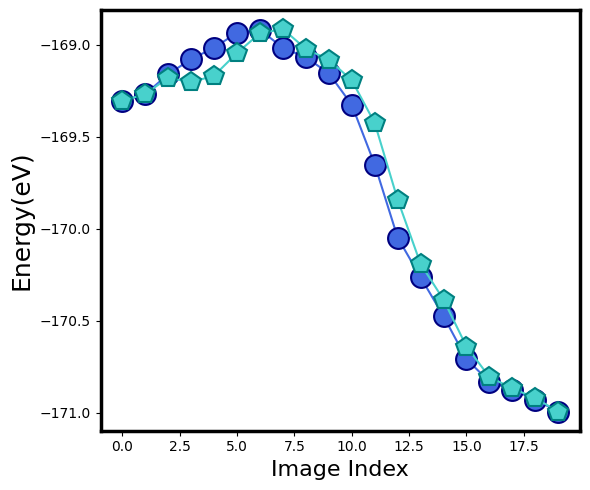

In [70]:
# Compute predicted path energies
path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[converged_index]])

plt.figure(figsize=(6, 5))

# Plot true energies
plt.plot(energies, 'o-', label='Classical NEB Energy Barrier', color='royalblue',
         markerfacecolor='royalblue', markeredgecolor='navy',
         markeredgewidth=1.5, markersize=15)

# Plot predicted energies
plt.plot(path_energy, 'p-', label='NN-BAX Energy Barrier', color='mediumturquoise',
         markerfacecolor='mediumturquoise', markeredgecolor='teal',
         markeredgewidth=1.5, markersize=15)

plt.xlabel("Image Index", fontsize=16)
plt.ylabel("Energy(eV)", fontsize=18)

# Bigger ticks font
#plt.xticks(ticks=range(0, len(energies), 5), fontsize=18)
#plt.yticks(ticks=[-173.0, -172.0, -171.0, -170, -169], fontsize=16)  # Set specific yticks


plt.tight_layout()
plt.show()


In [71]:

# Convert ASE Atoms object list to a 2D numpy array (20 steps x 21D positions)
neb_positions = np.array([atoms.positions.flatten() for atoms in images_ase])  # Shape (20, 21)

# Perform PCA (reduce 21D path to 2D)
pca = PCA(n_components=2)
neb_pca = pca.fit_transform(neb_positions)  # Shape (20, 2)

# Extract the transformed coordinates
pca_x, pca_y = neb_pca[:, 0], neb_pca[:, 1]

# Function to calculate LJ energy for a given configuration
def compute_lj_energy(positions):
    atoms = images_ase[0].copy()  # Copy an Atoms object to set new positions
    atoms.set_positions(positions.reshape(38, 3))
    atoms.set_calculator(LennardJones(rc=100))
    return atoms.get_potential_energy()

# Generate a grid for the contour plot
num_grid = 50  # Resolution of the contour grid
#x_min, x_max = pca_x.min() - 0.5, pca_x.max() + 0.5
#y_min, y_max = pca_y.min() - 0.5, pca_y.max() + 0.5
bound = 1.5

x_min, x_max = -bound, bound
y_min, y_max = -bound, bound


#y_min, y_max = -1.25, 0.5

grid_x, grid_y = np.meshgrid(np.linspace(x_min, x_max, num_grid),
                             np.linspace(y_min, y_max, num_grid))

# Correct transformation: use PCA inverse_transform to go back to 21D
grid_points_2d = np.c_[grid_x.ravel(), grid_y.ravel()]
grid_positions = pca.inverse_transform(grid_points_2d)

# Generate potential energy values over the grid
lj_energies = np.array([compute_lj_energy(pos) for pos in grid_positions])
lj_energies = lj_energies.reshape(grid_x.shape)  # Reshape to match grid


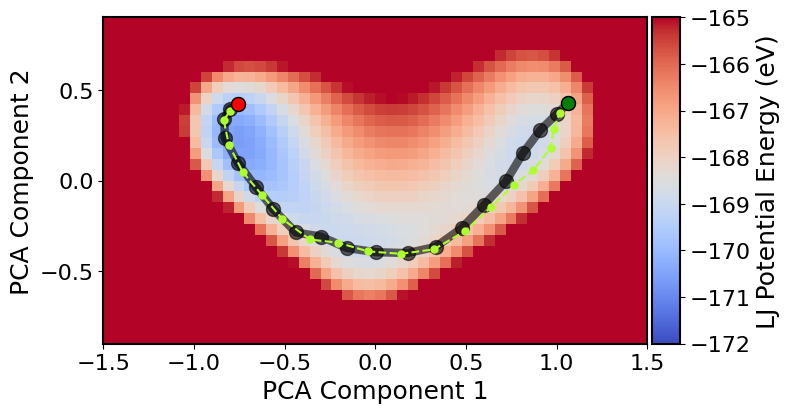

In [72]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams['axes.linewidth'] = 1.5

fig, ax = plt.subplots(figsize=(8, 8))

# Plot the LJ energy contour map with extent
im = ax.imshow(
    lj_energies,
    cmap="coolwarm",
    alpha=1,
    vmin=-172,
    vmax=-165,
    extent=(x_min, x_max, y_min, y_max),
    origin="lower"
)
# Keep the current x-limits
x_min_current, x_max_current = ax.get_xlim()
y_half_range = 0.6 * (x_max_current - x_min_current) / 2
ax.set_ylim(-y_half_range, y_half_range)

# Create an axes divider and append a colorbar axes that matches image height
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label("LJ Potential Energy (eV)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

# Plot the true NEB path (bigger, fainter black circles)
ax.plot(pca_x, pca_y, marker='o', linestyle='-', color="black", 
        markersize=10, linewidth = 6, alpha=0.6, label="Classical NEB Path")
ax.scatter(pca_x[0], pca_y[0], color="green", s=100, edgecolors="black", label="Start (Min 1)", zorder=3)
ax.scatter(pca_x[-1], pca_y[-1], color="red", s=100, edgecolors="black", label="End (Min 2)", zorder=3)

# Plot the BAX path in bright orange
path_pca = pca.transform(path)
ax.plot(path_pca[:, 0], path_pca[:, 1], marker='o', linestyle='--', 
        label="NN-BAX Path", color="greenyellow", markersize=5)

# Axis labels and ticks
ax.set_xlabel("PCA Component 1", fontsize=18)
ax.set_ylabel("PCA Component 2", fontsize=18)
ax.tick_params(axis='both', labelsize=16)

# Remove the title
# ax.set_title("...") ← removed

#ax.legend(fontsize=15)

plt.tight_layout()
plt.show()


# Foundation-BAX Plots

In [73]:
with open("results/9_12_HolyGrailLJ38_8to10_BAX150_MaxNEB650_JournalFinalSuite_subset_history.pkl", "rb") as f:
    subset_history_reference = np.array(pickle.load(f))

n_baxitr_ref = subset_history_reference.shape[0]
    
subset_history_numpy_reference = np.array(subset_history_reference).reshape(n_baxitr_ref, n_img, 38*3)

max_E_ref = []
for i in range(len(subset_history_numpy_reference)):
    path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy_reference[i]])
    max_E_ref.append(np.max(path_energy))

initial_energy = compute_lj_energy(initial_ase.get_positions())
energy_barrier_ref = max_E_ref - initial_energy

In [74]:
converged_index_ref = 100

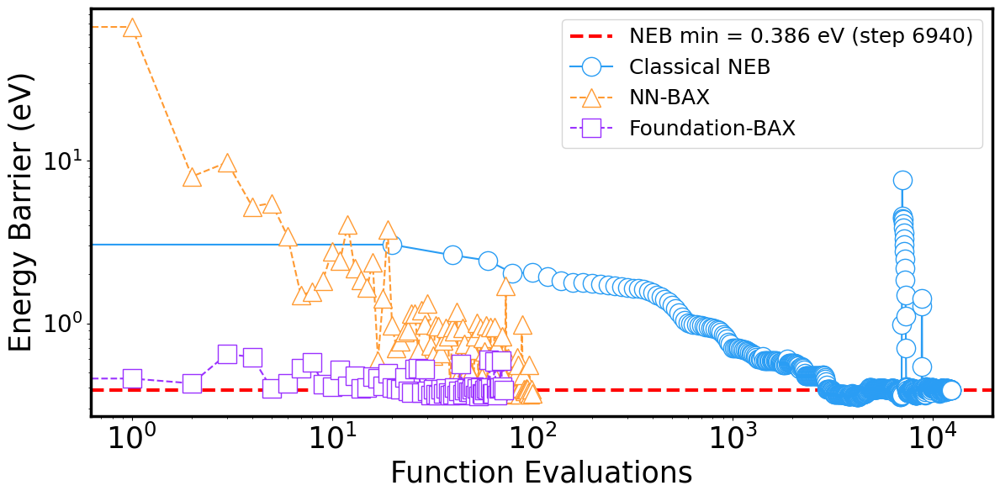

In [75]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['axes.linewidth'] = 2.5
marksize = 16

# assume `barriers`, `energy_barrier`, and `energy_barrier_linear` are defined

# NEB data
x_neb = np.arange(len(barriers)) * 20
y_neb = np.array(barriers)

# Foundation-BAX data
x_other = np.arange(len(energy_barrier))[:converged_index+1]
y_other = np.array(energy_barrier)[:converged_index+1]

# Reference NN-BAX data
x_other_nnbax = np.arange(len(energy_barrier_ref))[:converged_index_ref+1]
y_other_nnbax = np.array(energy_barrier_ref)[:converged_index_ref+1]

# NEB minimum
min_val = y_neb[-1]
min_step = x_neb[y_neb.argmin()]  # get x value, not index

plt.figure(figsize=(12, 6))

# NEB min line
plt.axhline(min_val, color='red', linestyle='--', linewidth=3,
            label=f'NEB min = {min_val:.3f} eV (step {min_step})')

# Plot NEB (brighter blue)
plt.plot(x_neb, y_neb, marker='o', linestyle='-', color='#2a9df4',
         markersize=marksize, label='Classical NEB', markerfacecolor='white')


# Plot NN-BAX
plt.plot(
    x_other_nnbax, y_other_nnbax, marker='^', linestyle='--', color='#ff9a32',
    markersize=marksize, label='NN-BAX', markerfacecolor='white'
)

# Plot Foundation-BAX 
plt.plot(x_other, y_other, marker='s', linestyle='--', color='#9b32ff',
         markersize=marksize, label='Foundation-BAX', markerfacecolor='white')





# Linear interpolation barrier
#plt.axhline(energy_barrier_linear, color='purple', linestyle='-.',
#            linewidth=3, label='Linear Interpolation Energy Barrier')

# Highlight minimum point
#plt.scatter(min_step, min_val, color='red', edgecolors='black',
#            zorder=5, s=100)

# Labels and title
plt.xlabel('Function Evaluations', fontsize=25)
plt.ylabel('Energy Barrier (eV)', fontsize=25)
#plt.title('Comparison of NEB vs BAX', fontsize=20, weight='bold')

# Axes settings
# Axes settings
plt.xscale('log')
#plt.xlim(10, 1000)
#plt.ylim(3, 100)
plt.yscale('log')
plt.xticks(fontsize=25)
plt.yticks(fontsize=20)

# Legend
plt.legend(fontsize=18, loc='best', frameon=True)

#plt.grid(True, which='both', linestyle=':', linewidth=0.5)
plt.tight_layout()
plt.show()


# A couple quick visuals

In [76]:
import py3Dmol
import numpy as np

# Convert to an XYZ string:
coords = initial_ase.get_positions()
xyz   = "38\n\n" + "\n".join(
    f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords
)

view = py3Dmol.view(width=1000, height=1000)
view.addModel(xyz, 'xyz')
view.setStyle({
    'sphere': {'radius': 0.4, },
    'stick':  {'radius': 0.02, 'color': 'lightgray'}
})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [77]:
coords = final_ase.get_positions()
xyz   = "38\n\n" + "\n".join(
    f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords
)

view = py3Dmol.view(width=1000, height=1000)
view.addModel(xyz, 'xyz')
view.setStyle({
    'sphere': {'radius': 0.4, },
    'stick':  {'radius': 0.02, 'color': 'lightgray'}
})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [78]:
import py3Dmol
import numpy as np

# 1) Extract coords from each ASE Atoms in images_ase
coords_list = [img.get_positions() for img in images_ase]

# 2) Build multi-frame XYZ
xyz_multi = ""
for idx, coords in enumerate(coords_list):
    xyz_multi += f"{len(coords)}\nFrame {idx}\n"
    xyz_multi += "\n".join(f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords)
    xyz_multi += "\n"

# 3) Create viewer and load frames
view = py3Dmol.view(width=800, height=800)
view.addModelsAsFrames(xyz_multi)

# 4) Style (spheres + sticks)
view.setStyle({
    'sphere': {'radius': 0.4, },
    'stick':  {'radius': 0.05, 'color': 'lightgray'}
})
view.zoomTo()

# 5) Animate
view.animate({
    'loop':     'forward',
    'reps':     0,
    'interval': 100
})
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [79]:
import py3Dmol
import numpy as np

# ---------- Params ----------
R_SPHERE = 0.4
R_STICK  = 0.02
COLOR_START = "#ffc0cb"   # light pink
COLOR_END   = "#ff0000"   # red
# ----------------------------

def hex_to_rgb(h):
    h = h.lstrip('#')
    return tuple(int(h[i:i+2], 16) for i in (0, 2, 4))

def rgb_to_hex(rgb):
    return "#{:02x}{:02x}{:02x}".format(*rgb)

def lerp(a, b, t):
    return a + (b - a) * t

def lerp_color(hex_a, hex_b, t):
    ra, ga, ba = hex_to_rgb(hex_a)
    rb, gb, bb = hex_to_rgb(hex_b)
    r = int(round(lerp(ra, rb, t)))
    g = int(round(lerp(ga, gb, t)))
    b = int(round(lerp(ba, bb, t)))
    return rgb_to_hex((r, g, b))

# ---- Compute distances ----
coords = initial_ase.get_positions()
N = len(coords)
centroid = coords.mean(axis=0)
dists = np.linalg.norm(coords - centroid, axis=1)

# Normalize to [0, 1]
dmin, dmax = dists.min(), dists.max()
norm = (dists - dmin) / (dmax - dmin + 1e-12)

# Map to colors
colors = [lerp_color(COLOR_START, COLOR_END, float(t)) for t in norm]

# ---- Make XYZ ----
xyz = f"{N}\n\n" + "\n".join(
    f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords
)

# ---- Render ----
view = py3Dmol.view(width=1000, height=1000)
view.addModel(xyz, 'xyz')

# Sticks: uniform
view.setStyle({'stick': {'radius': R_STICK, 'color': 'lightgray'}})

# Spheres: per-atom color
for i, c in enumerate(colors, start=1):
    view.setStyle({'serial': i}, {'sphere': {'radius': R_SPHERE, 'color': c}})

view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [80]:
import py3Dmol
import numpy as np

# 1) Extract coordinates from each ASE Atoms in images_ase
coords_list = [img.get_positions() for img in images_ase]
n_frames   = len(coords_list)
n_atoms    = coords_list[0].shape[0]

# 2) Build multi-frame XYZ string
xyz_multi = ""
for frame_idx, coords in enumerate(coords_list):
    xyz_multi += f"{n_atoms}\nFrame {frame_idx}\n"
    xyz_multi += "\n".join(f"Ar {x:.4f} {y:.4f} {z:.4f}"
                            for x, y, z in coords) + "\n"

# 3) Create the viewer and load all frames
view = py3Dmol.view(width=800, height=800)
view.addModelsAsFrames(xyz_multi)

# 4) Style: spheres only, no sticks
view.setStyle({
    'sphere': {'radius': 0.4, },
    'stick':  {'radius': 0.05, 'color': 'lightgray'}
})

# 5) Add displacement arrows for each atom between consecutive frames
arrow_radius = 0.02
arrow_color  = 'red'
for frame_idx in range(1, n_frames):
    prev = coords_list[frame_idx-1]
    curr = coords_list[frame_idx]
    for atom_idx in range(n_atoms):
        x0, y0, z0 = prev[atom_idx]
        x1, y1, z1 = curr[atom_idx]
        view.addArrow({
            'start':   {'x': x0, 'y': y0, 'z': z0},
            'end':     {'x': x1, 'y': y1, 'z': z1},
            'radius':  arrow_radius,
            'color':   arrow_color,
            'opacity': 1.0,
            'model':   frame_idx
        })

# 6) Fit and animate
view.zoomTo()
view.animate({
    'loop':     'forward',
    'reps':     0,      # infinite loop
    'interval': 100     # ms per frame
})
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

# Supplementary Figures

### Transition State Preds

In [44]:
# Compute predicted path energies
path_energy = np.array([compute_lj_energy(pos) for pos in subset_history_numpy[converged_index]])
max_energy_index_BAX = np.argmax(path_energy)

max_energy_index_classical = np.argmax(energies)

print(max_energy_index_BAX,max_energy_index_classical )

5 6


In [45]:
# Convert to an XYZ string:
coords = subset_history_numpy[converged_index][max_energy_index_BAX].reshape(38, 3)
xyz   = "38\n\n" + "\n".join(
    f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords
)

view = py3Dmol.view(width=1000, height=1000)
view.addModel(xyz, 'xyz')
view.setStyle({
    'sphere': {'radius': 0.4, 'color': 'slateblue' },
    'stick':  {'radius': 0.03, 'color': 'lightgray'}
})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [46]:
# Convert to an XYZ string:
coords = images_ase[max_energy_index_classical].get_positions()
xyz   = "38\n\n" + "\n".join(
    f"Ar {x:.4f} {y:.4f} {z:.4f}" for x, y, z in coords
)

view = py3Dmol.view(width=1000, height=1000)
view.addModel(xyz, 'xyz')
view.setStyle({
    'sphere': {'radius': 0.4, 'color': 'slateblue' },
    'stick':  {'radius': 0.03, 'color': 'lightgray'}
})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [47]:
converged_index

60

### Energy and Force Predictions

In [48]:
equi_calc_converged_path = "/sdf/group/mli/pranav/8_05_ELJ7_BAX15_NEB25_Epochs=50_fmax=0_05_saveAllModels/lj7-finetune0/checkpoints/2025-08-05-15-26-08-ft-lj7/best_checkpoint.pt"

equi_calc_converged_path = OCPCalculator(checkpoint_path=equi_calc_0_path, 
                     seed=42, 
                     cpu=False, 
                     trainer='ocp')



NameError: name 'equi_calc_0_path' is not defined

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams['axes.linewidth'] = 1.5

fig, ax = plt.subplots(figsize=(8, 8))

# Plot the LJ energy contour map with extent
im = ax.imshow(
    lj_energies,
    cmap="coolwarm",
    alpha=1,
    vmin=-172,
    vmax=-165,
    extent=(x_min, x_max, y_min, y_max),
    origin="lower"
)
# Keep the current x-limits
x_min_current, x_max_current = ax.get_xlim()
y_half_range = 0.6 * (x_max_current - x_min_current) / 2
ax.set_ylim(-y_half_range, y_half_range)

# Create an axes divider and append a colorbar axes that matches image height
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label("LJ Potential Energy (eV)", fontsize=18)
cbar.ax.tick_params(labelsize=16)

# Axis labels and ticks
ax.set_xlabel("PCA Component 1", fontsize=18)
ax.set_ylabel("PCA Component 2", fontsize=18)
ax.tick_params(axis='both', labelsize=16)

# Remove the title
# ax.set_title("...") ← removed

#ax.legend(fontsize=15)

plt.tight_layout()
plt.show()
